In [1]:
# read the data
import matplotlib.pyplot as plt
import numpy as np
#import pandas as pd 
import matplotlib
import sys     
import mne     
import os
from mne.preprocessing import ICA
from scipy import stats
import seaborn as sns
import pandas as pd
#%matplotlib qt
sys.path.append(os.path.abspath('..'))
from utils import identify_bad_channels,remove_epochs_with_bad_mmn_channels, Average_in_trials_in_time_window,remove_or_interpolate_epochs_with_n_bad_chn
from stats_utils import extract_mmn_latencies,align_and_standardize_evokeds,extract_peak_amplitude,extract_mean_amplitudes,snap_times_to_evoked
from visualization import plot_erps

In [2]:
folder = r'E:\ecf-exp2-notif-mmn\data\Processed\SME_scores'
print(os.listdir(folder))
participant_info = pd.read_excel(f'E:/ecf-exp2-notif-mmn/data/Processed/Participant_details.xlsx')
participant_info.head() 

['sub-sd011_BN_mmn.csv', 'sub-sd011_BN_n1.csv', 'sub-sd011_SN_mmn.csv', 'sub-sd011_SN_n1.csv', 'sub-sd012_BN_mmn.csv', 'sub-sd012_BN_n1.csv', 'sub-sd012_SN_mmn.csv', 'sub-sd012_SN_n1.csv', 'sub-sd013_BN_mmn.csv', 'sub-sd013_BN_n1.csv', 'sub-sd013_SN_mmn.csv', 'sub-sd013_SN_n1.csv', 'sub-sd015_BN_mmn.csv', 'sub-sd015_BN_n1.csv', 'sub-sd015_SN_mmn.csv', 'sub-sd015_SN_n1.csv', 'sub-sd016_BN_mmn.csv', 'sub-sd016_BN_n1.csv', 'sub-sd016_SN_mmn.csv', 'sub-sd016_SN_n1.csv', 'sub-sd017_BN_mmn.csv', 'sub-sd017_BN_n1.csv', 'sub-sd017_SN_mmn.csv', 'sub-sd017_SN_n1.csv', 'sub-sd018_BN_mmn.csv', 'sub-sd018_BN_n1.csv', 'sub-sd018_SN_mmn.csv', 'sub-sd018_SN_n1.csv', 'sub-sd019_BN_mmn.csv', 'sub-sd019_BN_n1.csv', 'sub-sd019_SN_mmn.csv', 'sub-sd019_SN_n1.csv', 'sub-sd020_BN_mmn.csv', 'sub-sd020_BN_n1.csv', 'sub-sd020_SN_mmn.csv', 'sub-sd020_SN_n1.csv', 'sub-sd021_BN_mmn.csv', 'sub-sd021_BN_n1.csv', 'sub-sd021_SN_mmn.csv', 'sub-sd021_SN_n1.csv', 'sub-sd022_BN_mmn.csv', 'sub-sd022_BN_n1.csv', 'sub-sd022_S

,participant_id,age,is_controlled_block,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,sd011,30.0,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,NaN,NaN
1,sd012,25.0,N,M,PG_acd,SN,BT,NaN,No bad channel,Whoop_doop,0.036576,NaN,NaN,NaN,NaN
2,sd013,25.0,N,M,PG_acd,SN,BT,NaN,TP10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,NaN,NaN
3,sd014,28.0,N,M,PG_acd,SN,BT,NaN,bad electrode = None Bad subject only very few...,droplet,0.034830,NaN,NaN,NaN,NaN
4,sd015,31.0,N,M,PG_acd,SN,BT,NaN,bad electrode = None,realme_fun,0.006780,NaN,NaN,NaN,NaN


## Plot function 


In [3]:
import matplotlib.pyplot as plt
import pandas as pd

def prepare_metric_df(BN_dict, SN_dict, metric="PL"):
    """
    Merge BN and SN dicts into a DataFrame for the given metric (PL or PA).
    """
    rows = []
    for subj in BN_dict.keys():
        if subj in SN_dict:
            rows.append({
                "subject": subj,
                f"BN_{metric}_mean": BN_dict[subj][f"{metric}_mean"],
                f"BN_{metric}_std":  BN_dict[subj][f"{metric}_std"],
                f"SN_{metric}_mean": SN_dict[subj][f"{metric}_mean"],
                f"SN_{metric}_std":  SN_dict[subj][f"{metric}_std"]
            })
    return pd.DataFrame(rows)

def plot_bn_vs_sn(df, metric="PL", title="BN vs SN", highlight_sig=False, ax=None):
    """
    Scatter plot of BN vs SN metric with error bars and x=y line.

    Parameters
    ----------
    df : pd.DataFrame
        Data with subject, BN/SN means and stds, optionally 'significant'.
    metric : str
        "PL" or "PA".
    title : str
        Title of the plot.
    highlight_sig : bool
        If True and 'significant' column exists, significant subjects darker.
    ax : matplotlib.axes.Axes, optional
        If given, plot inside this subplot. Otherwise create new figure.
    """
    # Create axis if not passed
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 7))

    x = df[f"BN_{metric}_mean"]
    y = df[f"SN_{metric}_mean"]
    xerr = df[f"BN_{metric}_std"]
    yerr = df[f"SN_{metric}_std"]

    # Assign distinct colors per subject
    palette = sns.color_palette("tab20", n_colors=df["subject"].nunique())
    subj_to_color = dict(zip(df["subject"].unique(), palette))

    # Plot each subject
    for _, row in df.iterrows():
        if highlight_sig and "significant" in df.columns:
            alpha = 1.0 if row["significant"] else 0.3
        else:
            alpha = 0.9

        ax.errorbar(
            row[f"BN_{metric}_mean"], row[f"SN_{metric}_mean"],
            xerr=row[f"BN_{metric}_std"], yerr=row[f"SN_{metric}_std"],
            fmt="o", color=subj_to_color[row["subject"]],
            ecolor=subj_to_color[row["subject"]],
            elinewidth=1.5, capsize=3, alpha=alpha,
            label=row["subject"]
        )

    # Reference line
    lims = [min(x.min(), y.min())*0.9, max(x.max(), y.max())*1.1]
    ax.plot(lims, lims, "k--", alpha=0.8, label="x = y")

    # Labels
    label = {
        "PA_mean": "PA_mean ($\\mu V$)",
        "PA_std":  "PA_std ($\\mu V$)",
        "PL_mean": "PL_mean (s)",
        "PL_std":  "PL_std (s)"
    }
    ax.set_xlabel(f"BN {label[f'{metric}_mean']}")
    ax.set_ylabel(f"SN {label[f'{metric}_mean']}")
    ax.set_title(f"{title}, {label[f'{metric}_mean']}")

    ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left",
              borderaxespad=0., title="Subject")
    ax.axis("equal")

    # Only show if function made the figure
    if ax is None:
        plt.tight_layout()
        plt.show()


In [4]:
for sub in os.listdir(folder):
    

        print(sub)

sub-sd011_BN_mmn.csv
sub-sd011_BN_n1.csv
sub-sd011_SN_mmn.csv
sub-sd011_SN_n1.csv
sub-sd012_BN_mmn.csv
sub-sd012_BN_n1.csv
sub-sd012_SN_mmn.csv
sub-sd012_SN_n1.csv
sub-sd013_BN_mmn.csv
sub-sd013_BN_n1.csv
sub-sd013_SN_mmn.csv
sub-sd013_SN_n1.csv
sub-sd015_BN_mmn.csv
sub-sd015_BN_n1.csv
sub-sd015_SN_mmn.csv
sub-sd015_SN_n1.csv
sub-sd016_BN_mmn.csv
sub-sd016_BN_n1.csv
sub-sd016_SN_mmn.csv
sub-sd016_SN_n1.csv
sub-sd017_BN_mmn.csv
sub-sd017_BN_n1.csv
sub-sd017_SN_mmn.csv
sub-sd017_SN_n1.csv
sub-sd018_BN_mmn.csv
sub-sd018_BN_n1.csv
sub-sd018_SN_mmn.csv
sub-sd018_SN_n1.csv
sub-sd019_BN_mmn.csv
sub-sd019_BN_n1.csv
sub-sd019_SN_mmn.csv
sub-sd019_SN_n1.csv
sub-sd020_BN_mmn.csv
sub-sd020_BN_n1.csv
sub-sd020_SN_mmn.csv
sub-sd020_SN_n1.csv
sub-sd021_BN_mmn.csv
sub-sd021_BN_n1.csv
sub-sd021_SN_mmn.csv
sub-sd021_SN_n1.csv
sub-sd022_BN_mmn.csv
sub-sd022_BN_n1.csv
sub-sd022_SN_mmn.csv
sub-sd022_SN_n1.csv
sub-sd023_BN_mmn.csv
sub-sd023_BN_n1.csv
sub-sd023_SN_mmn.csv
sub-sd023_SN_n1.csv
sub-sd024_BN_mmn

In [5]:
import os
import glob
import pandas as pd

# Path where your csv files are stored
path = r"E:\ecf-exp2-notif-mmn\data\Processed\SME_scores"

# Grab all CSV files
files = glob.glob(os.path.join(path, "*.csv"))

# Initialize dicts
SN_N1_SME = {}
SN_MMN_SME = {}
BN_N1_SME = {}
BN_MMN_SME = {}

# Loop through files
for file in files:
    # Extract parts from filename
    fname = os.path.basename(file)  # e.g. sub-sd011_BN_n1.csv
    parts = fname.replace(".csv", "").split("_")  
    # -> ["sub-sd011", "BN", "n1"]

    sub_id = parts[0].replace("sub-", "")  # sd011
    cond = parts[1]                        # BN or SN
    measure = parts[2].lower()             # n1 or mmn

    # Load csv
    df = pd.read_csv(file)

    # Compute stats
    PA_mean = df["PA"].mean()
    PA_std  = df["PA"].std()
    PL_mean = df["PL"].mean()
    PL_std  = df["PL"].std()

    result = {
        "PA_mean": PA_mean,
        "PA_std": PA_std,
        "PL_mean": PL_mean,
        "PL_std": PL_std,
    }

    # Save into correct dict
    if cond == "SN" and measure == "n1":
        SN_N1_SME[sub_id] = result
    elif cond == "SN" and measure == "mmn":
        SN_MMN_SME[sub_id] = result
    elif cond == "BN" and measure == "n1":
        BN_N1_SME[sub_id] = result
    elif cond == "BN" and measure == "mmn":
        BN_MMN_SME[sub_id] = result

print("SN_N1_SME:", list(SN_N1_SME.keys())[:5])
print("SN_MMN_SME:", list(SN_MMN_SME.keys())[:5])
print("BN_N1_SME:", list(BN_N1_SME.keys())[:5])
print("BN_MMN_SME:", list(BN_MMN_SME.keys())[:5])

SN_N1_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']
SN_MMN_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']
BN_N1_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']
BN_MMN_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']


## Subject vs PL and PA mean std 

54


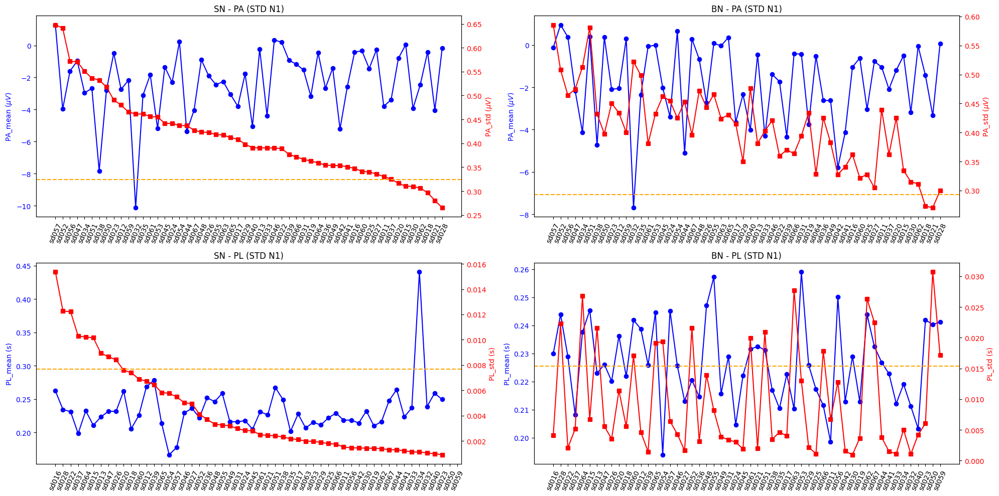

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

def prepare_df(SME_dict):
    """Convert dict to DataFrame (with subject as column)."""
    return pd.DataFrame(SME_dict).T.reset_index().rename(columns={"index": "subject"})

def plot_metric(ax, SME_dict, metric_mean, metric_std, title, subject_order):
    df = prepare_df(SME_dict)
    df = df.set_index("subject").loc[subject_order].reset_index()  # enforce same order

    label = {
        "PA_mean": "PA_mean ($\\mu V$)",   
        "PA_std":  "PA_std ($\\mu V$)",
        "PL_mean": "PL_mean (s)",
        "PL_std":  "PL_std (s)"
    }

    subjects = df["subject"]
    means = df[metric_mean]
    stds = df[metric_std]
    half_stds = stds / 2
    x = range(len(subjects))

    # Mean (blue line, left axis)
    ax.plot(x, means, color="blue", marker="o")
    ax.set_ylabel(label[metric_mean], color="blue")
    ax.tick_params(axis="y", labelcolor="blue")
    ax.set_title(title, fontsize=12)

    # Std (red line, right axis)
    ax2 = ax.twinx()
    ax2.plot(x, stds, color="red", marker="s")# Horizontal line at half of the max std
    half_max_std = stds.max() / 2
    ax2.axhline(half_max_std, color="orange", linestyle="--", linewidth=1.5,
                label=f"Half max std ({half_max_std:.2f})")
    ax2.set_ylabel(label[metric_std], color="red")
    ax2.tick_params(axis="y", labelcolor="red")

    # X-axis subjects
    ax.set_xticks(list(x))
    ax.set_xticklabels(subjects, rotation=65, ha="center")

# ==================
# usage
# ==================

# Build DataFrames
df_sn = prepare_df(SN_N1_SME)
df_bn = prepare_df(BN_N1_SME)

# Define subject orders separately
order_pa = df_sn.sort_values(by="PA_std", ascending=False)["subject"].tolist()
order_pl = df_sn.sort_values(by="PL_std", ascending=False)["subject"].tolist()
print(len(order_pl ))
# 2x2 plots
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
 
# PA plots (sorted by SN PA_std)
plot_metric(axes[0,0], SN_N1_SME, "PA_mean", "PA_std", "SN - PA (STD N1)", order_pa)
plot_metric(axes[0,1], BN_N1_SME, "PA_mean", "PA_std", "BN - PA (STD N1)", order_pa)

# PL plots (sorted by SN PL_std)
plot_metric(axes[1,0], SN_N1_SME, "PL_mean", "PL_std", "SN - PL (STD N1)", order_pl)
plot_metric(axes[1,1], BN_N1_SME, "PL_mean", "PL_std", "BN - PL (STD N1)", order_pl)

plt.tight_layout()
plt.show()


54


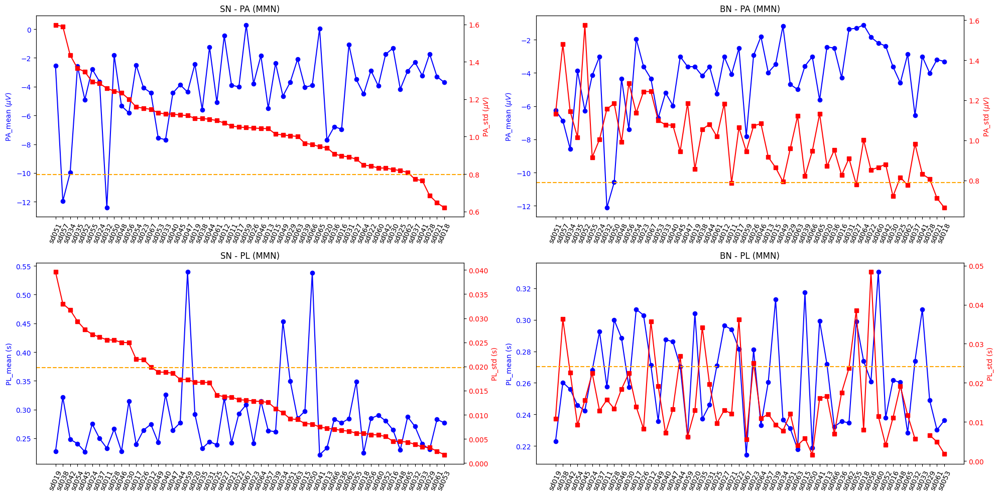

In [7]:
df_sn_mmn = prepare_df(SN_MMN_SME)
df_bn_mmn = prepare_df(BN_MMN_SME)

# Define subject orders separately
order_pa = df_sn_mmn.sort_values(by="PA_std", ascending=False)["subject"].tolist()
order_pl = df_sn_mmn.sort_values(by="PL_std", ascending=False)["subject"].tolist()
print(len(order_pl ))
# 2x2 plots
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
 
# PA plots (sorted by SN PA_std)
plot_metric(axes[0,0], SN_MMN_SME, "PA_mean", "PA_std", "SN - PA (MMN)", order_pa)
plot_metric(axes[0,1], BN_MMN_SME, "PA_mean", "PA_std", "BN - PA (MMN)", order_pa)

# PL plots (sorted by SN PL_std)
plot_metric(axes[1,0], SN_MMN_SME, "PL_mean", "PL_std", "SN - PL (MMN)", order_pl)
plot_metric(axes[1,1], BN_MMN_SME, "PL_mean", "PL_std", "BN - PL (MMN)", order_pl)

plt.tight_layout()
plt.show()


#  significance for sn mmn pl < bn mmn pl with bonferroni correction

In [11]:
import os
import glob
import numpy as np
import pandas as pd
from scipy.stats import ttest_rel,wilcoxon,mannwhitneyu
def load_bootstrap_pl_dict(path, condition="BN"):
    """
    Reads all *_<condition>_mmn.csv files in a folder
    Returns dict: {subject_id: numpy.array of PL bootstrap samples}
    """
    files = glob.glob(os.path.join(path, f"*_ {condition}_mmn.csv").replace(" ", ""))
    result = {}
    for f in files:
        fname = os.path.basename(f)   # e.g. sub-sd011_BN_mmn.csv
        parts = fname.split("_")      # ['sub-sd011', 'BN', 'mmn.csv']
        subj = parts[0]               # 'sub-sd011'
        df = pd.read_csv(f)
        result[subj] = df["PL"].values
    return result


def per_subject_sn_lt_bn_with_bonferroni(SN_boot, BN_boot, alpha=0.05):
    """
    For each subject present in both SN and BN dicts:
    Test if SN_PL < BN_PL (using bootstrap samples).
    Apply Bonferroni correction across subjects.
    """
    results = []

    for subj in sorted(set(SN_boot.keys()) & set(BN_boot.keys())):
        sn_vals = SN_boot[subj]
        bn_vals = BN_boot[subj]
        sn_vals=sn_vals[~np.isnan(sn_vals)]
        bn_vals=bn_vals[~np.isnan(bn_vals)]
        # # Difference distribution (SN - BN)
        # diffs = sn_vals - bn_vals
        
        # p-value = fraction of diffs < 0
        #p_raw = np.mean(diffs < 0)
        min_len = min(len(sn_vals), len(bn_vals))
        # sn_sample = np.random.choice(sn_vals, min_len, replace=False)
        # bn_sample = np.random.choice(bn_vals, min_len, replace=False)
        # t_stat, p_val_two_sided = wilcoxon(sn_sample, bn_sample)
        t_stat, p_val_two_sided = mannwhitneyu(sn_vals, bn_vals) 
        # if t_stat<0:
        #     p_val_one_sided = p_val_two_sided/2
        # else:
        #     p_val_one_sided = 1-(p_val_two_sided/2)
        results.append({
            "subject": subj,
            "SN_mean_PL": np.mean(sn_vals),
            "BN_mean_PL": np.mean(bn_vals),
            "SN_minus_BN_mean": np.mean(sn_vals) - np.mean(bn_vals),
            "p_raw": p_val_two_sided
        })

    df_res = pd.DataFrame(results)

    # Bonferroni correction
    m = len(df_res)
    df_res["p_bonferroni"] = np.minimum(df_res["p_raw"] * m, 1.0)
    df_res["significant"] = df_res["p_bonferroni"] < alpha

    return df_res



SN_boot = load_bootstrap_pl_dict(path, "SN")
BN_boot = load_bootstrap_pl_dict(path, "BN")


df_results = per_subject_sn_lt_bn_with_bonferroni(SN_boot, BN_boot, alpha=0.05)
df_results["subject"] = df_results["subject"].str.replace("sub-", "", regex=False)
df_results


,subject,SN_mean_PL,BN_mean_PL,SN_minus_BN_mean,p_raw,p_bonferroni,significant
0,sd011,0.232727,0.257654,-0.024928,6.308276e-64,3.406469e-62,True
1,sd012,0.274369,0.271190,0.003179,7.945197e-03,4.290406e-01,False
2,sd013,0.233094,0.271818,-0.038724,1.218112e-152,6.577806e-151,True
3,sd015,0.297246,0.317217,-0.019972,2.474574e-45,1.336270e-43,True
4,sd016,0.264617,0.261602,0.003016,3.248103e-20,1.753976e-18,True
5,sd017,0.239656,0.306665,-0.067009,4.167623e-75,2.250516e-73,True
6,sd018,0.224609,0.273816,-0.049207,2.371374e-165,1.280542e-163,True
7,sd019,0.226838,0.222891,0.003947,7.021859e-03,3.791804e-01,False
8,sd020,0.292008,0.303988,-0.011980,1.804954e-25,9.746754e-24,True
9,sd021,0.242383,0.293887,-0.051504,9.672145e-154,5.222958e-152,True


##  Scatter plot of tone delay vs N1 latency, include errorbars based on latency N1 (and color the points by tone)

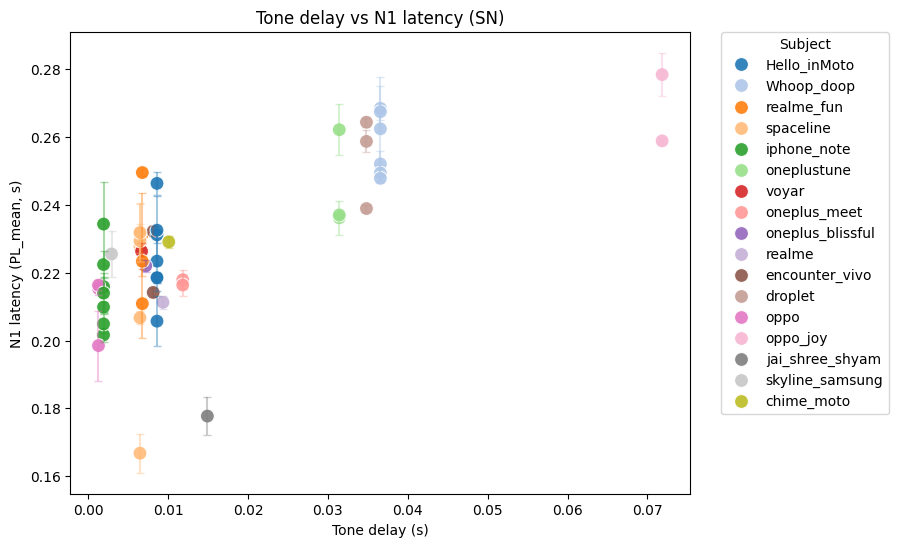

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Merge the two dataframes on subject/participant_id
df = df_sn.merge(participant_info, left_on="subject", right_on="participant_id")

# Pick subjects to plot (or keep all)

df_sel = df[df["SN_tone"]!="vibration"]

# Create scatterplot
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_sel,
    x="Tone_delay",
    y="PL_mean",
    hue="SN_tone",    # color by subject
    s=100,
    palette="tab20",
    alpha= 0.9,
)
# Use seaborn palette for consistent colors
palette = sns.color_palette("tab20", n_colors=df_sel ["SN_tone"].nunique())
subject_colors = dict(zip(df_sel["SN_tone"].unique(), palette))
# Add subject-colored error bars
for i, row in df_sel.iterrows():
    plt.errorbar(
        row["Tone_delay"],
        row["PL_mean"],
        yerr=row["PL_std"],
        fmt="none",
        ecolor=subject_colors[row["SN_tone"]],
        elinewidth=1.5,
        capsize=3,
        alpha=0.4
    )


# Labels and formatting
plt.xlabel("Tone delay (s)")
plt.ylabel("N1 latency (PL_mean, s)")
plt.title("Tone delay vs N1 latency (SN)")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.,title="Subject")
plt.show()


# Visual: Subject with good Good N1

In [10]:
N1_STD_peak_sub_id = [11, 12, 17, 18,19, 21, 24, 25, 26, 29, 30 , 31, 32, 33 , 35,  36 ,37, 38,39,40,41,42,44,  45, 46, 47 ,49]
N1_STD_peak_sub = ['sd0' +str(id)    for id in N1_STD_peak_sub_id]
N1_STD_peak_sub

['sd011',
 'sd012',
 'sd017',
 'sd018',
 'sd019',
 'sd021',
 'sd024',
 'sd025',
 'sd026',
 'sd029',
 'sd030',
 'sd031',
 'sd032',
 'sd033',
 'sd035',
 'sd036',
 'sd037',
 'sd038',
 'sd039',
 'sd040',
 'sd041',
 'sd042',
 'sd044',
 'sd045',
 'sd046',
 'sd047',
 'sd049']

### Tone delay vs N1 latency

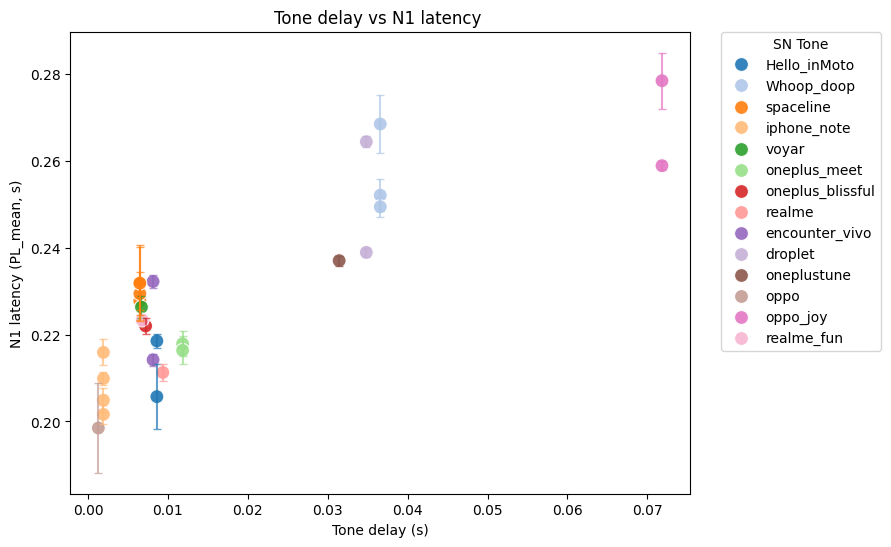

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Merge the two dataframes on subject/participant_id
df = df_sn.merge(participant_info, left_on="subject", right_on="participant_id")
# Pick subjects to with good N1 plot (or keep all)

df_sel = df[df["subject"].isin(N1_STD_peak_sub)]

# Create scatterplot
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_sel,
    x="Tone_delay",
    y="PL_mean",
    hue="SN_tone",    # color by subject
    s=100,
    palette="tab20",
    alpha= 0.9,
)
# Use seaborn palette for consistent colors
palette = sns.color_palette("tab20", n_colors=df_sel ["SN_tone"].nunique())
subject_colors = dict(zip(df_sel["SN_tone"].unique(), palette))
# Add subject-colored error bars
for i, row in df_sel.iterrows():
    plt.errorbar(
        row["Tone_delay"],
        row["PL_mean"],
        yerr=row["PL_std"],
        fmt="none",
        ecolor=subject_colors[row["SN_tone"]],
        elinewidth=1.5,
        capsize=3,
        alpha=0.7
    )


# Labels and formatting
plt.xlabel("Tone delay (s)")
plt.ylabel("N1 latency (PL_mean, s)")
plt.title("Tone delay vs N1 latency ")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.,title="SN Tone")
plt.show()


### BN vs SN

In [18]:

# === Example usage ===
# Latency (PL)
df_latency = prepare_metric_df(BN_MMN_SME, SN_MMN_SME, metric="PL")
df_latency=df_latency[df_latency["subject"].isin(N1_STD_peak_sub)]
plot_bn_vs_sn(df_latency, metric="PL")

# Amplitude (PA)
df_amplitude = prepare_metric_df(BN_MMN_SME, SN_MMN_SME, metric="PA")
df_amplitude =df_amplitude[df_amplitude ["subject"].isin(N1_STD_peak_sub)]
plot_bn_vs_sn(df_amplitude, metric="PA")





NameError: name 'N1_STD_peak_sub' is not defined

# SME based Subject Selection

## based on N1 only 

In [19]:
good_sub_N1_SN_BN = []

for subj in SN_N1_SME.keys():
    

    # Criterion 1: N1 SEM < 0.011 in both conditions
    if BN_N1_SME[subj]["PL_std"] < 0.0125 and SN_N1_SME[subj]["PL_std"] < 0.0125:
            good_sub_N1_SN_BN.append(subj)
print("Selected subjects:", len(good_sub_N1_SN_BN),good_sub_N1_SN_BN)

Selected subjects: 35 ['sd011', 'sd012', 'sd015', 'sd017', 'sd018', 'sd019', 'sd020', 'sd021', 'sd022', 'sd023', 'sd024', 'sd025', 'sd026', 'sd027', 'sd029', 'sd030', 'sd031', 'sd032', 'sd033', 'sd034', 'sd035', 'sd036', 'sd037', 'sd038', 'sd039', 'sd040', 'sd041', 'sd042', 'sd044', 'sd045', 'sd046', 'sd047', 'sd049', 'sd055', 'sd057']


### Tone delay vs N1 latency

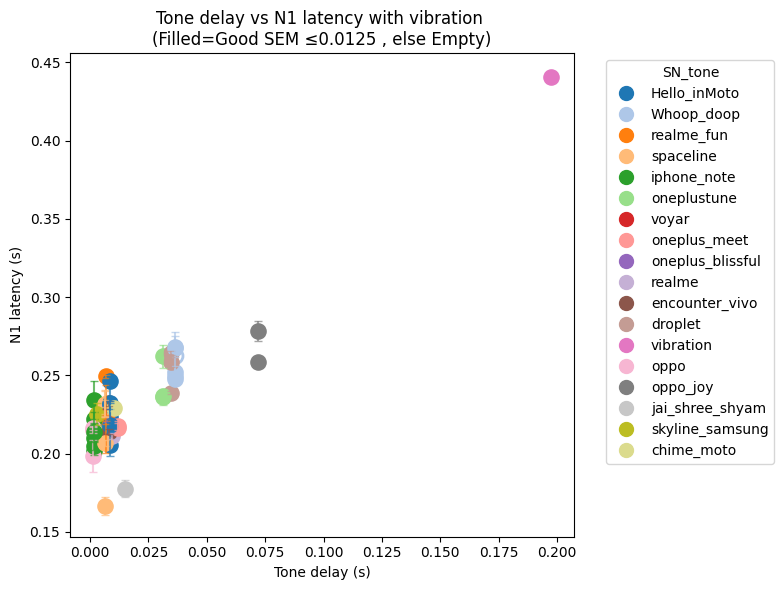

In [20]:

df = df_sn.merge(participant_info, left_on="subject", right_on="participant_id")
# Make a palette for SN_tone
palette = sns.color_palette("tab20", n_colors=df["SN_tone"].nunique())
tone_to_color = dict(zip(df["SN_tone"].unique(), palette))

plt.figure(figsize=(8,6))

for _, row in df.iterrows():
    tone = row["SN_tone"]
    color = tone_to_color[tone]
    
    # Good vs bad subject based on SEM threshold
    if row["PL_std"] > 0.0125:  # bad subject
        plt.scatter(
            row["Tone_delay"],
            row["PL_mean"],
            facecolors="none",   # empty circle
            edgecolors=color,    # edgecolor based on tone
            s=120,
            linewidths=2
        )
    else:  # good subject
        plt.scatter(
            row["Tone_delay"],
            row["PL_mean"],
            facecolors=color,    # filled with tone color
            edgecolors=color,    # matching edge
            s=120
        )
    
    # Error bars (also tone-colored)
    plt.errorbar(
        row["Tone_delay"],
        row["PL_mean"],
        yerr=row["PL_std"],
        fmt="none",
        ecolor=color,
        elinewidth=1.5,
        capsize=3,
        alpha=0.7
    )

# === Build a clean legend only once ===
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=color, markeredgecolor=color, markersize=10, label=tone)
    for tone, color in tone_to_color.items()
]

plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc="upper left", title="SN_tone")

plt.xlabel("Tone delay (s)")
plt.ylabel("N1 latency (s)")
plt.title("Tone delay vs N1 latency with vibration \n(Filled=Good SEM ≤0.0125 , else Empty)")

plt.tight_layout()
plt.show()


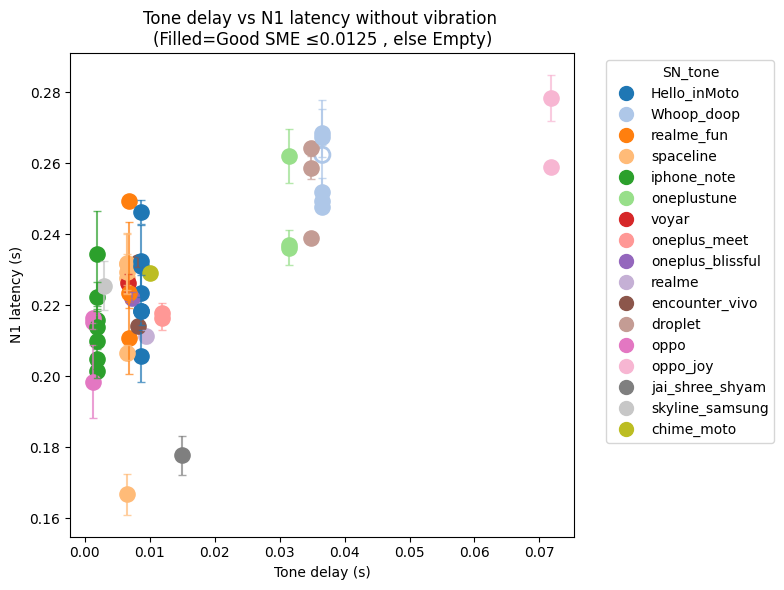

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
# Merge subject info (if not already merged)
df = df_sn.merge(participant_info, left_on="subject", right_on="participant_id")
df = df[df["SN_tone"]!="vibration"]# Mark subjects as "good" or "bad" based on SEM
# Make a palette for SN_tone
palette = sns.color_palette("tab20", n_colors=df["SN_tone"].nunique())
tone_to_color = dict(zip(df["SN_tone"].unique(), palette))

plt.figure(figsize=(8,6))

for _, row in df.iterrows():
    tone = row["SN_tone"]
    color = tone_to_color[tone]
    
    # Good vs bad subject based on SEM threshold
    if row["PL_std"] > 0.0125:  # bad subject
        plt.scatter(
            row["Tone_delay"],
            row["PL_mean"],
            facecolors="none",   # empty circle
            edgecolors=color,    # edgecolor based on tone
            s=120,
            linewidths=2
        )
    else:  # good subject
        plt.scatter(
            row["Tone_delay"],
            row["PL_mean"],
            facecolors=color,    # filled with tone color
            edgecolors=color,    # matching edge
            s=120
        )
    
    # Error bars (also tone-colored)
    plt.errorbar(
        row["Tone_delay"],
        row["PL_mean"],
        yerr=row["PL_std"],
        fmt="none",
        ecolor=color,
        elinewidth=1.5,
        capsize=3,
        alpha=0.7
    )

# === Build a clean legend only once ===
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=color, markeredgecolor=color, markersize=10, label=tone)
    for tone, color in tone_to_color.items()
]

plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc="upper left", title="SN_tone")

plt.xlabel("Tone delay (s)")
plt.ylabel("N1 latency (s)")
plt.title("Tone delay vs N1 latency without vibration \n(Filled=Good SME ≤0.0125 , else Empty)")

plt.tight_layout()
plt.show()


## Based on N1 and MMN latency 

In [30]:
good_sub_N1_MMN = []

for subj in BN_MMN_SME.keys():
    # check subject exists in both dicts
    if subj not in SN_MMN_SME:
        continue 

    # Criterion 1: MMN SEM < 0.03 in both conditions
    if BN_N1_SME[subj]["PL_std"] <= 0.0125 and SN_N1_SME[subj]["PL_std"] <= 0.0125 and BN_MMN_SME[subj]["PL_std"] <= 0.03 and SN_MMN_SME[subj]["PL_std"] <= 0.03:
    #if BN_MMN_SME[subj]["PL_std"] <= 0.03 and SN_MMN_SME[subj]["PL_std"] <= 0.03:
            good_sub_N1_MMN.append(subj)

print("Selected subjects:", len(good_sub_N1_MMN),good_sub_N1_MMN)

Selected subjects: 27 ['sd011', 'sd015', 'sd017', 'sd018', 'sd020', 'sd021', 'sd023', 'sd024', 'sd025', 'sd026', 'sd027', 'sd029', 'sd030', 'sd031', 'sd032', 'sd034', 'sd036', 'sd037', 'sd039', 'sd040', 'sd041', 'sd044', 'sd045', 'sd046', 'sd047', 'sd049', 'sd057']


### BN vs SN

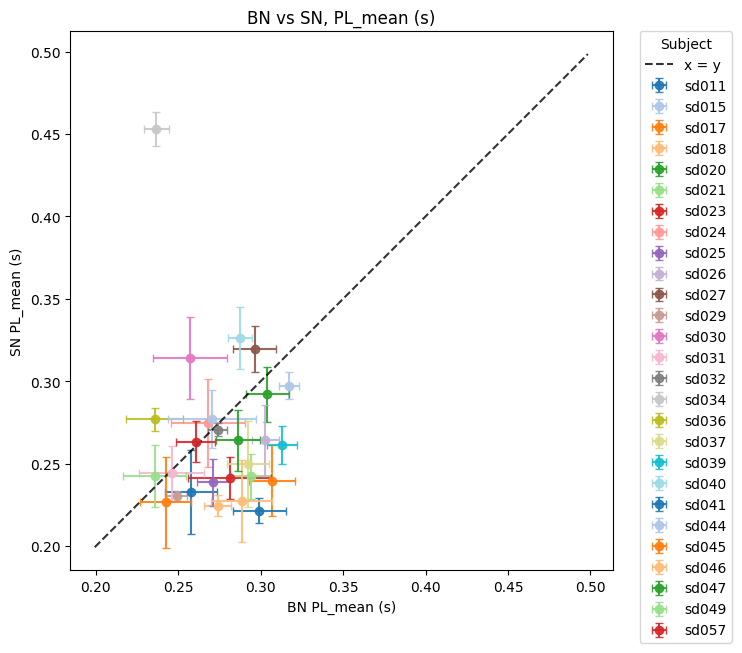

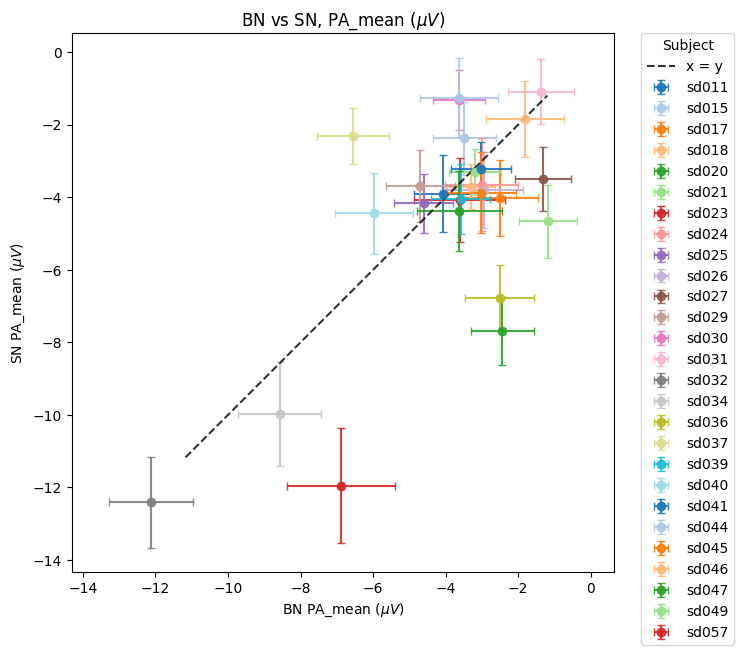

In [31]:
# Latency (PL)
df_latency = prepare_metric_df(BN_MMN_SME, SN_MMN_SME, metric="PL")
df_latency=df_latency[df_latency["subject"].isin(good_sub_N1_MMN)]
plot_bn_vs_sn(df_latency, metric="PL",highlight_sig=True)
 
# Amplitude (PA)
df_amplitude = prepare_metric_df(BN_MMN_SME, SN_MMN_SME, metric="PA")
df_amplitude =df_amplitude[df_amplitude ["subject"].isin(good_sub_N1_MMN)]
plot_bn_vs_sn(df_amplitude, metric="PA",highlight_sig=True)



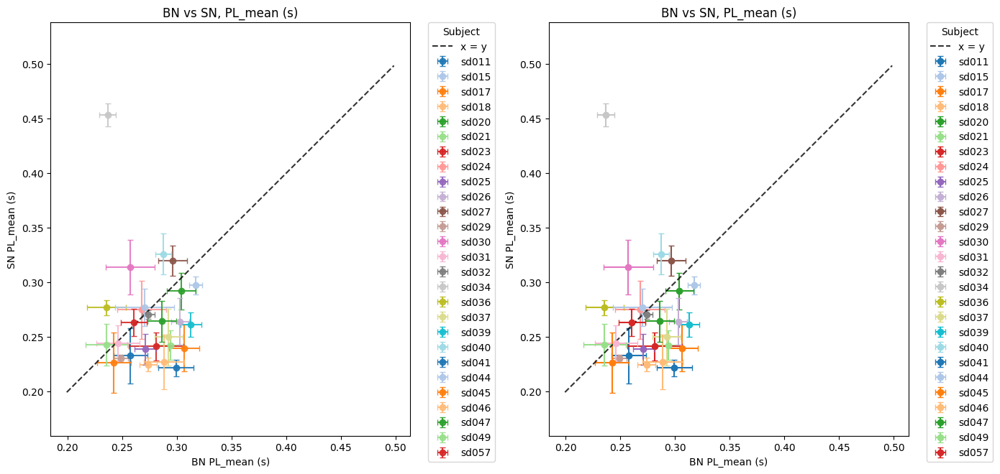

In [33]:
# Merge significance info outside the function
df_plot = df_latency.merge(df_results[["subject", "significant"]], on="subject", how="left")

fig, axes = plt.subplots(1, 2, figsize=(14, 7))

plot_bn_vs_sn(df_plot, metric="PL", highlight_sig=False, ax=axes[0])
plot_bn_vs_sn(df_plot, metric="PL", highlight_sig=True, ax=axes[1])

plt.tight_layout()
plt.show()

In [19]:
df_latency.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27 entries, 0 to 44
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   subject     27 non-null     object 
 1   BN_PL_mean  27 non-null     float64
 2   BN_PL_std   27 non-null     float64
 3   SN_PL_mean  27 non-null     float64
 4   SN_PL_std   27 non-null     float64
dtypes: float64(4), object(1)
memory usage: 1.3+ KB


# Grand averaged MMN 


In [20]:
def merge_latency_dicts(SN_SME, BN_SME,good_sub_ls= None):
    merged = {}
    for subj in SN_SME.keys() & SN_SME.keys():  # only subjects present in both
        
        if good_sub_ls== None :
            merged["sub-"+subj] = {
                "beep": {"time": BN_SME[subj]["PL_mean"]},  # BN latency
                "sn":   {"time": SN_SME[subj]["PL_mean"]}   # SN latency
                }
        elif subj in good_sub_ls:
            merged["sub-"+subj] = { 
                "beep": {"time": BN_SME[subj]["PL_mean"]},  # BN latency 
                "sn":   {"time": SN_SME[subj]["PL_mean"]}   # SN latency
                }
            
    return merged


combined_dict = merge_latency_dicts(SN_N1_SME, BN_N1_SME,good_sub_N1_MMN)

len(combined_dict)

27

## Read Epoch and make evoke 


In [21]:
SN_devi_eps_evoked_dict  = {}
BN_std_eps_evoked_dict  = {}
BN_devi_eps_evoked_dict = {}
SN_std_eps_evoked_dict = {}

epoch_folder = r"E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched"
for sub in os.listdir(epoch_folder ):
    if sub=="CAR":
        continue
    epochs = mne.read_epochs(os.path.join(epoch_folder,sub), preload=True)
    print("BN STD : ", len(epochs['S14']),"SN STD : ", len(epochs['S24']) )
    SN_devi_eps = epochs['S15'].average()
    BN_std_eps = epochs['S14'].average()
    BN_devi_eps = epochs['S25'].average()
    SN_std_eps = epochs['S24'].average() 
    SN_devi_eps_evoked_dict[sub[:-8]] = SN_devi_eps
    BN_devi_eps_evoked_dict[sub[:-8]] = BN_devi_eps
    SN_std_eps_evoked_dict[sub[:-8]] = SN_std_eps
    BN_std_eps_evoked_dict[sub[:-8]] = BN_std_eps

Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd011-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1291 matching events found
No baseline correction applied
0 projection items activated
BN STD :  373 SN STD :  708
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd012-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1519 matching events found
No baseline correction applied
0 projection items activated
BN STD :  667 SN STD :  606
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd013-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1702 matching events found
No baseline correction applied
0 projection items activated

In [22]:

evoked_dicts_std = {
    "beep": BN_std_eps_evoked_dict,
    "sn": SN_std_eps_evoked_dict
}

N1_snapped_std = snap_times_to_evoked(combined_dict, evoked_dicts_std)
# evoked_dicts_dev = {
#     "beep": BN_devi_eps_evoked_dict,
#     "sn": SN_devi_eps_evoked_dict
# }

# N1_snapped_dev = snap_times_to_evoked(combined_dict, evoked_dicts_dev)

print(N1_snapped_std)
# {'beep': {'time': 0.240234375}, 'sn': {'time': 0.256510417}} (snapped to evoked time grid)

{'sub-sd030': {'beep': {'time': 0.228515625}, 'sn': {'time': 0.232421875}}, 'sub-sd044': {'beep': {'time': 0.2265625}, 'sn': {'time': 0.263671875}}, 'sub-sd018': {'beep': {'time': 0.22265625}, 'sn': {'time': 0.205078125}}, 'sub-sd020': {'beep': {'time': 0.236328125}, 'sn': {'time': 0.26171875}}, 'sub-sd034': {'beep': {'time': 0.21875}, 'sn': {'time': 0.44140625}}, 'sub-sd041': {'beep': {'time': 0.22265625}, 'sn': {'time': 0.22265625}}, 'sub-sd045': {'beep': {'time': 0.22265625}, 'sn': {'time': 0.205078125}}, 'sub-sd039': {'beep': {'time': 0.2265625}, 'sn': {'time': 0.279296875}}, 'sub-sd027': {'beep': {'time': 0.212890625}, 'sn': {'time': 0.236328125}}, 'sub-sd015': {'beep': {'time': 0.24609375}, 'sn': {'time': 0.2109375}}, 'sub-sd057': {'beep': {'time': 0.24609375}, 'sn': {'time': 0.177734375}}, 'sub-sd040': {'beep': {'time': 0.203125}, 'sn': {'time': 0.259765625}}, 'sub-sd032': {'beep': {'time': 0.2109375}, 'sn': {'time': 0.23828125}}, 'sub-sd046': {'beep': {'time': 0.2265625}, 'sn':

In [23]:
len(N1_snapped_std)

27

In [24]:
# Step 1: Align evoked data to threshold times
beep_N1_aligned_STD_all = align_and_standardize_evokeds(
    BN_std_eps_evoked_dict, 
    N1_snapped_std, 
    condition_key='beep'
)


sn_N1_aligned_STD_all = align_and_standardize_evokeds(
    SN_std_eps_evoked_dict,
    N1_snapped_std, 
    condition_key='sn'
)

beep_N1_aligned_devi_all = align_and_standardize_evokeds(
    BN_devi_eps_evoked_dict, 
    N1_snapped_std,         
    condition_key='beep'
)

sn_N1_aligned_devi_all = align_and_standardize_evokeds(
    SN_devi_eps_evoked_dict, 
    N1_snapped_std, 
    condition_key='sn'
)

Successfully aligned 27 subjects: ['sub-sd015', 'sub-sd017', 'sub-sd030', 'sub-sd025', 'sub-sd018', 'sub-sd031', 'sub-sd020', 'sub-sd023', 'sub-sd040', 'sub-sd057', 'sub-sd046', 'sub-sd011', 'sub-sd034', 'sub-sd032', 'sub-sd029', 'sub-sd049', 'sub-sd021', 'sub-sd036', 'sub-sd041', 'sub-sd044', 'sub-sd045', 'sub-sd037', 'sub-sd047', 'sub-sd024', 'sub-sd026', 'sub-sd039', 'sub-sd027']
Successfully aligned 27 subjects: ['sub-sd015', 'sub-sd017', 'sub-sd030', 'sub-sd025', 'sub-sd018', 'sub-sd031', 'sub-sd020', 'sub-sd023', 'sub-sd040', 'sub-sd057', 'sub-sd046', 'sub-sd011', 'sub-sd034', 'sub-sd032', 'sub-sd029', 'sub-sd049', 'sub-sd021', 'sub-sd036', 'sub-sd041', 'sub-sd044', 'sub-sd045', 'sub-sd037', 'sub-sd047', 'sub-sd024', 'sub-sd026', 'sub-sd039', 'sub-sd027']
Successfully aligned 27 subjects: ['sub-sd015', 'sub-sd017', 'sub-sd030', 'sub-sd025', 'sub-sd018', 'sub-sd031', 'sub-sd020', 'sub-sd023', 'sub-sd040', 'sub-sd057', 'sub-sd046', 'sub-sd011', 'sub-sd034', 'sub-sd032', 'sub-sd029'

In [25]:
len(beep_N1_aligned_STD_all)

27

## N1 aligned MMN

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<Axes: title={'center': 'MMN (N1 STD time align) (mean)'}, xlabel='Time (ms)', ylabel='Evoked Responses (µV)'>

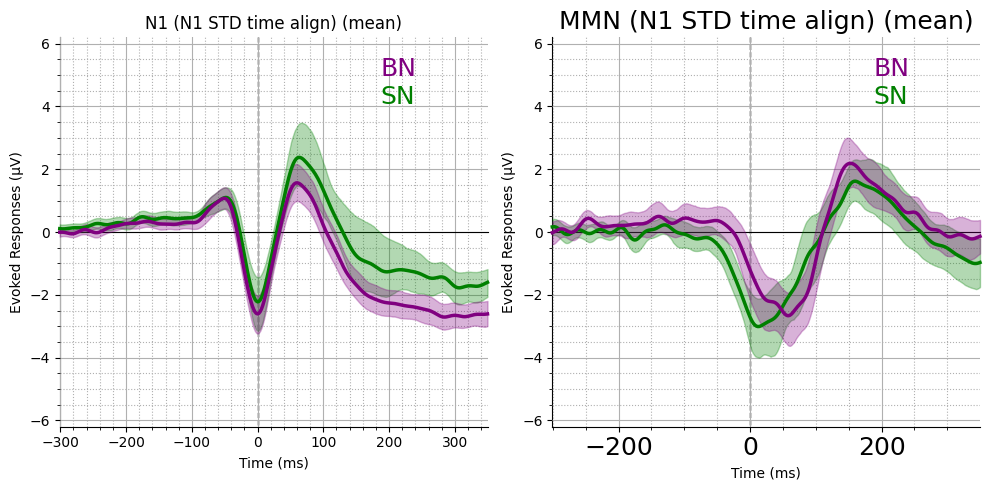

In [26]:
sn_STD_N1_aligned_SN_MMN_evokeds_dict_all = {sub1:mne.combine_evoked([sn_N1_aligned_devi_all[sub1], sn_N1_aligned_STD_all[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(sn_N1_aligned_devi_all,sn_N1_aligned_STD_all) if sub1==sub2 }  
beep_STD_N1_aligned_BN_MMN_evokeds_dict_all = {sub1:mne.combine_evoked([beep_N1_aligned_devi_all[sub1], beep_N1_aligned_STD_all[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(beep_N1_aligned_devi_all ,beep_N1_aligned_STD_all) if sub1==sub2 } 

stylesdict ={
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
text_labels = [
            (0.90, "BN",'purple'),
            (0.83, f"SN",'green'),
            ] 
time_range=(-.300,.350)

fig, axs = plt.subplots(1,2, figsize=(10, 5), dpi=100)
N1_evokeds = { 
           'PN':sn_N1_aligned_STD_all.values() ,
           'BN':beep_N1_aligned_STD_all.values()  ,
                      }

plot_erps(N1_evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs[0],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"N1 (N1 STD time align)",time_range=time_range)
MMN_evokeds = { 
           'PN':sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.values() ,
           'BN':beep_STD_N1_aligned_BN_MMN_evokeds_dict_all.values()  ,
                      } 
plot_erps(MMN_evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs[1],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"MMN (N1 STD time align)",time_range=time_range)    

In [34]:
len(sn_N1_aligned_STD_all.values())

NameError: name 'sn_N1_aligned_STD_all' is not defined

### Stats : Amplitude

 Mean  Amplitude : t_stat [160.] with , p_value [0.49961102]
 Peak Amplitude : t_stat 143.0 with , p_value 0.27924175560474396


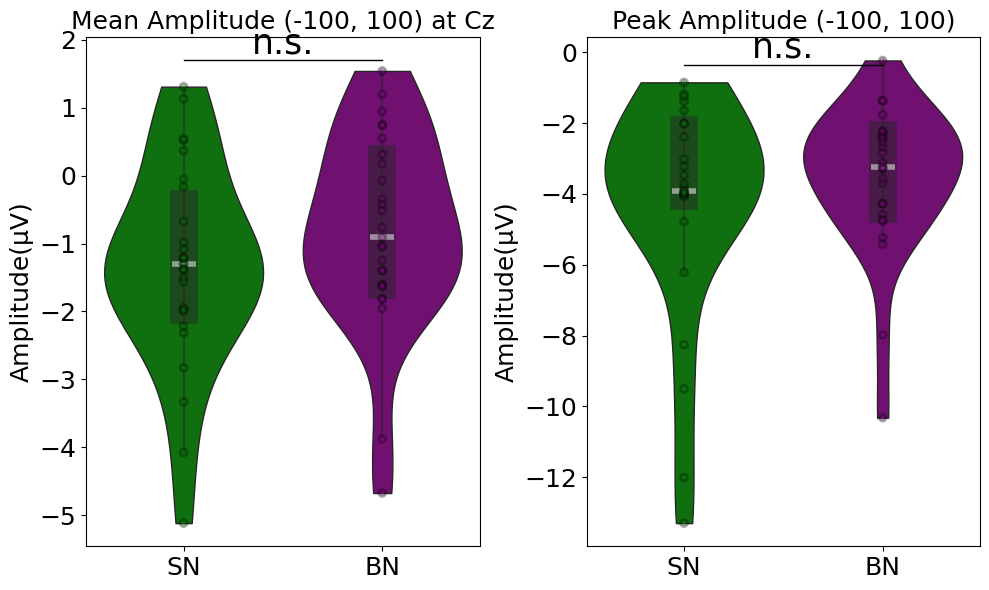

In [28]:
from scipy import stats
import seaborn as sns
from scipy.stats import wilcoxon,ttest_ind,ttest_rel
df_type = "Amplitude"
label=("SN", "BN")
time_window = (-100,100)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels

def df_convert(case1_amps, case2_amps, label=("Case1", "Case2"), title='', df_type = "Amplitude"):
    n_subjects, n_channels = case1_amps.shape
    data = pd.DataFrame({
        df_type: np.concatenate([case1_amps.flatten(), case2_amps.flatten()]),
        'Case': np.repeat([label[0], label[1]], n_subjects * n_channels),

    })
    
    return data
# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mean_amplitudes(
    sn_STD_N1_aligned_SN_MMN_evokeds_dict_all ,beep_STD_N1_aligned_BN_MMN_evokeds_dict_all , time_window=time_window, channels=channels
)



#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df = df_convert(PN_amps*1e+6, BN_amps*1e+6,label=("SN", "BN") ,df_type = df_type)
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)

sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = wilcoxon(PN_amps, BN_amps)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])
 
PN_amps_peak = np.array(list(extract_peak_amplitude(sn_STD_N1_aligned_SN_MMN_evokeds_dict_all,time_window = (-.100, .10),channels=["Cz"]).values()))*1e+6
BN_amps_peak =np.array(list(extract_peak_amplitude(beep_STD_N1_aligned_BN_MMN_evokeds_dict_all ,time_window = (-.100, .10),channels=["Cz"]).values()))*1e+6


# Fraction area plot 
df=df_convert(PN_amps_peak.reshape(-1, 1), BN_amps_peak.reshape(-1, 1),label=("SN", "BN") ,df_type = df_type)

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = wilcoxon(PN_amps_peak, BN_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '*' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### Stats : Latency

Shapiro-Wilk test (Peak latency): ShapiroResult(statistic=0.963088200263814, pvalue=0.43334699042155245)
D’Agostino and Pearson’s test (Peak latency): NormaltestResult(statistic=0.678188050960586, pvalue=0.7124154607340714)


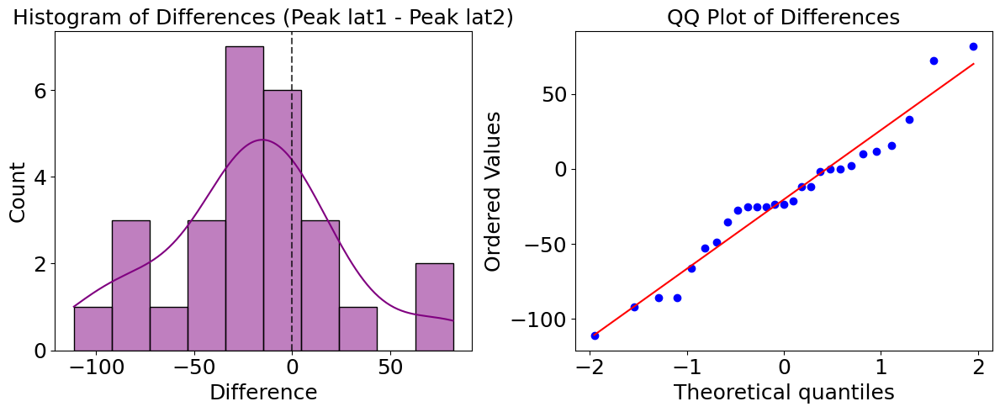

Shapiro-Wilk test (Area latency ): ShapiroResult(statistic=0.9525334021943836, pvalue=0.24683850234476556)
D’Agostino and Pearson’s test (Area latency ): NormaltestResult(statistic=3.5891020326542047, pvalue=0.16620205760757556)


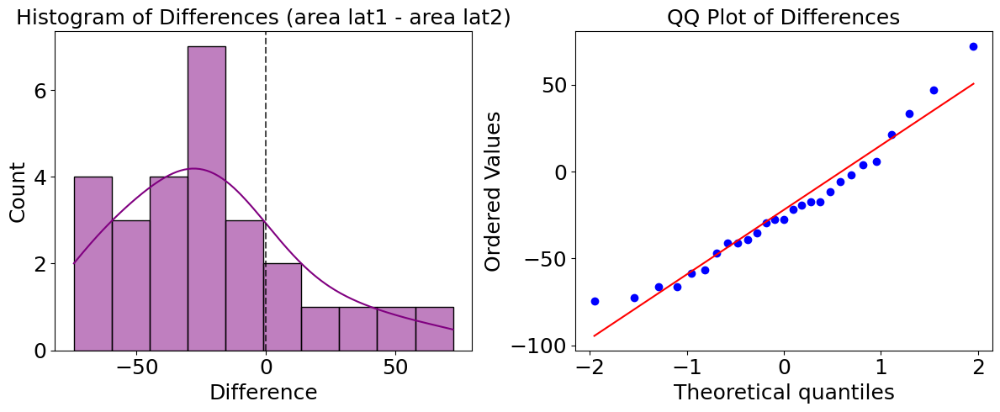

In [29]:
from scipy.stats import shapiro, normaltest, probplot
time_window = (-100, 100) 
peak_lat1, peak_lat2, subjects = extract_mmn_latencies(
     sn_STD_N1_aligned_SN_MMN_evokeds_dict_all ,beep_STD_N1_aligned_BN_MMN_evokeds_dict_all , time_window=time_window, 
    channels=channels, method='peak')
area_lat1, area_lat2, subjects = extract_mmn_latencies(
    sn_STD_N1_aligned_SN_MMN_evokeds_dict_all ,beep_STD_N1_aligned_BN_MMN_evokeds_dict_all, time_window=time_window, 
    channels=channels, method='fractional_area', fractional_area=0.5)
# Convert to arrays with matching subjects (intersection only)
common_subjects = set(peak_lat1.keys()) & set(peak_lat2.keys())
lat1 = np.array([peak_lat1[s] for s in common_subjects])
lat2 = np.array([peak_lat2[s] for s in common_subjects])

# Compute difference
diff = lat1 - lat2
# === Normality tests ===
print("Shapiro-Wilk test (Peak latency):", stats.shapiro(diff))
print("D’Agostino and Pearson’s test (Peak latency):",normaltest(diff))
# === Plot side by side ===
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Histogram
sns.histplot(diff, kde=True, bins=10, color="purple", ax=axes[0])
axes[0].axvline(0, color="black", linestyle="--", alpha=0.7)
axes[0].set_title("Histogram of Differences (Peak lat1 - Peak lat2)")
axes[0].set_xlabel("Difference")
axes[0].set_ylabel("Count")

# QQ plot
stats.probplot(diff, dist="norm", plot=axes[1])
axes[1].set_title("QQ Plot of Differences")

plt.tight_layout()
plt.show()

common_subjects = set(area_lat1.keys()) & set(area_lat2.keys())
lat1 = np.array([area_lat1[s] for s in common_subjects])
lat2 = np.array([area_lat2[s] for s in common_subjects])
# Compute difference
diff = lat1 - lat2
# === Normality tests ===
print("Shapiro-Wilk test (Area latency ):", stats.shapiro(diff))
print("D’Agostino and Pearson’s test (Area latency ):",normaltest(diff))
# === Plot side by side ===
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Histogram
sns.histplot(diff, kde=True, bins=10, color="purple", ax=axes[0])
axes[0].axvline(0, color="black", linestyle="--", alpha=0.7)
axes[0].set_title("Histogram of Differences (area lat1 - area lat2)")
axes[0].set_xlabel("Difference")
axes[0].set_ylabel("Count")

# QQ plot
stats.probplot(diff, dist="norm", plot=axes[1])
axes[1].set_title("QQ Plot of Differences")

plt.tight_layout()
plt.show()



Peak latency ;- t_stat [72.5] with , p_value [0.0154002]
Fractional area (50 %) latency ;- t_stat [74.] with , p_value [0.0046127]


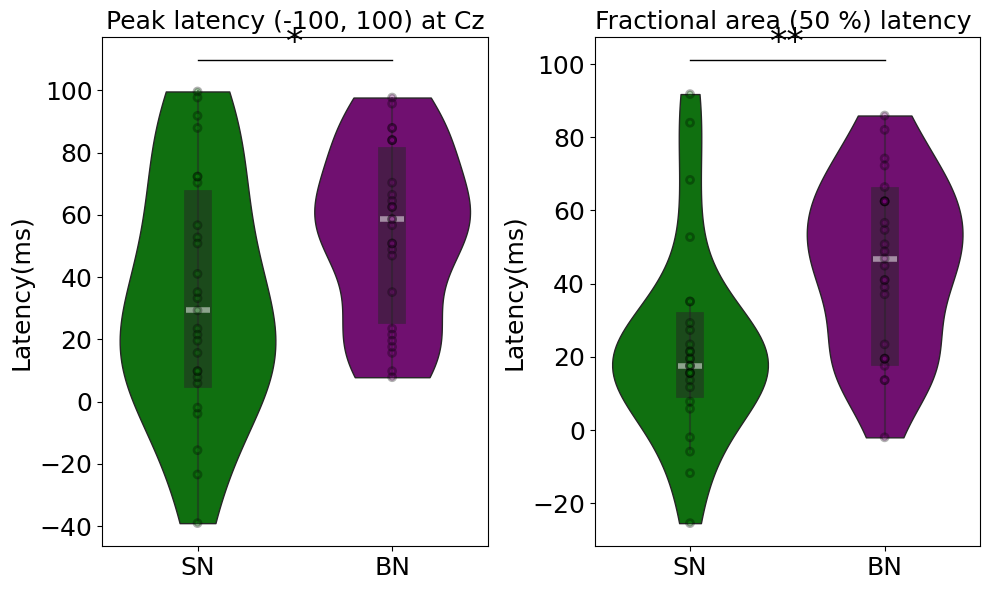

In [30]:
# Extract Latency    
df_type = "Latency"
label=("SN", "BN")
 # ms - typical MMN window
channels =["Cz"]
# Set up the plot

df = df_convert(np.array(list(peak_lat1.values())).reshape(-1,1), np.array(list(peak_lat2.values()) ).reshape(-1,1),label=("SN", "BN"),df_type = df_type)


df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'), 
#             capprops=dict(color='black'),  
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = wilcoxon(np.array(list(peak_lat1.values())).reshape(-1,1), np.array(list(peak_lat2.values()) ).reshape(-1,1))
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])




# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df = df_convert(np.array(list(area_lat1.values())).reshape(-1,1), np.array(list(area_lat2.values()) ).reshape(-1,1),label=("SN", "BN"),df_type = df_type)
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = wilcoxon( np.array(list(area_lat1.values())).reshape(-1,1), np.array(list(area_lat2.values()) ).reshape(-1,1))
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label =  '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"


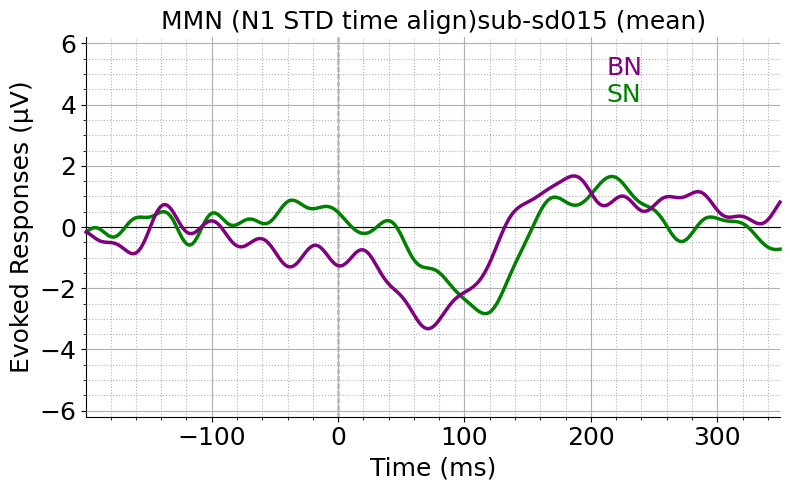

combining channels using "mean"
combining channels using "mean"


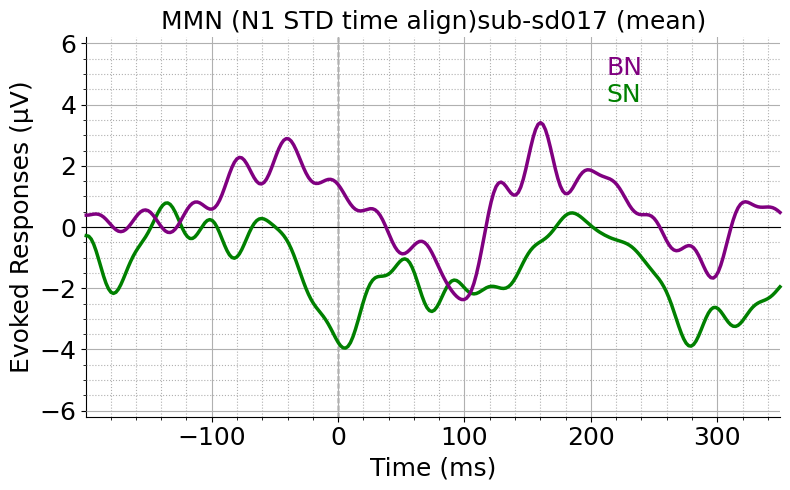

combining channels using "mean"
combining channels using "mean"


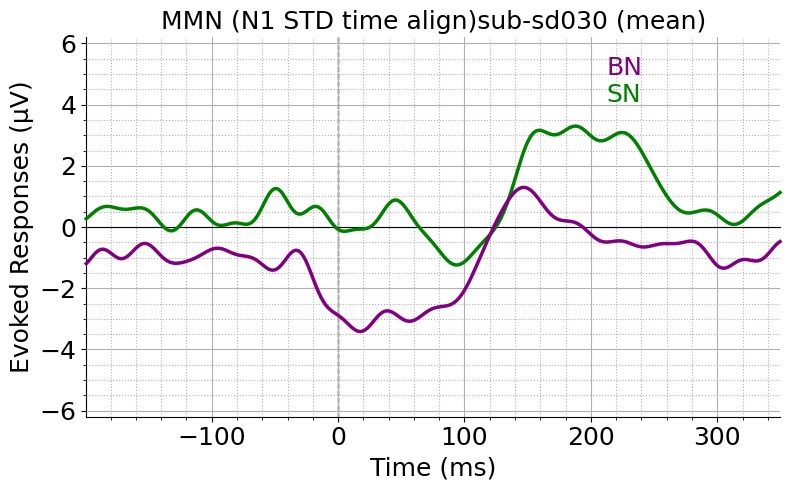

combining channels using "mean"
combining channels using "mean"


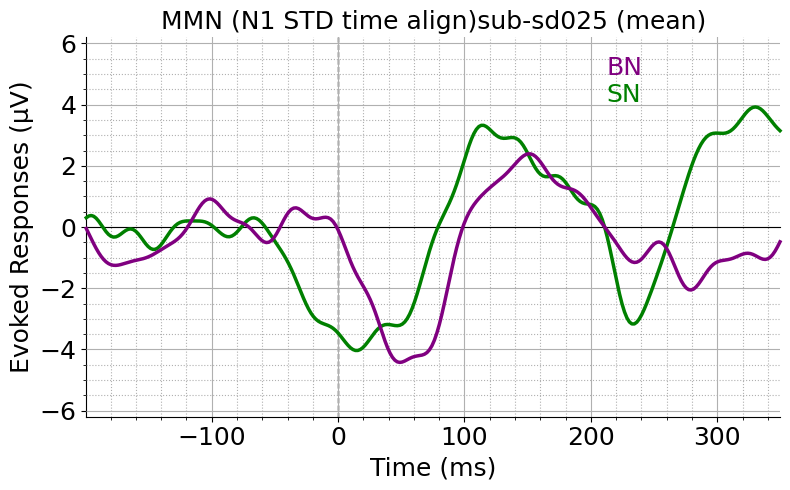

combining channels using "mean"
combining channels using "mean"


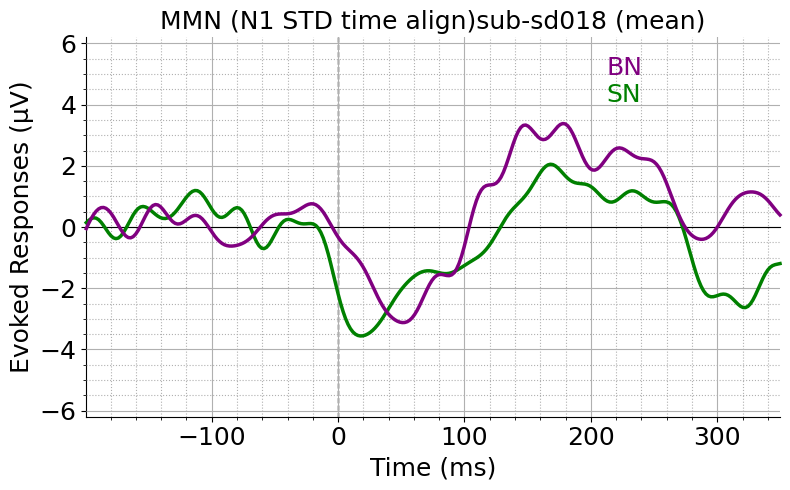

combining channels using "mean"
combining channels using "mean"


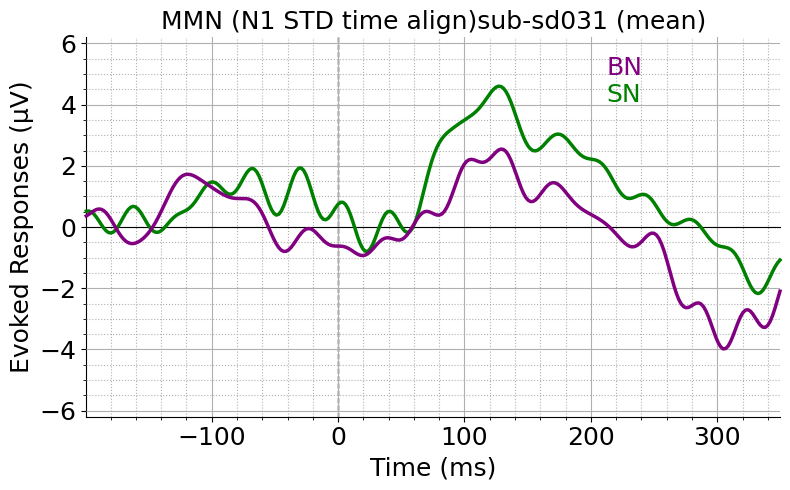

combining channels using "mean"
combining channels using "mean"


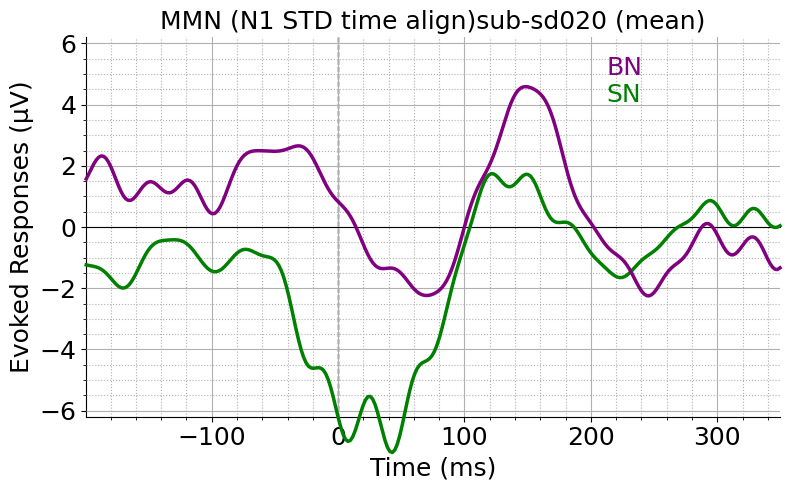

combining channels using "mean"
combining channels using "mean"


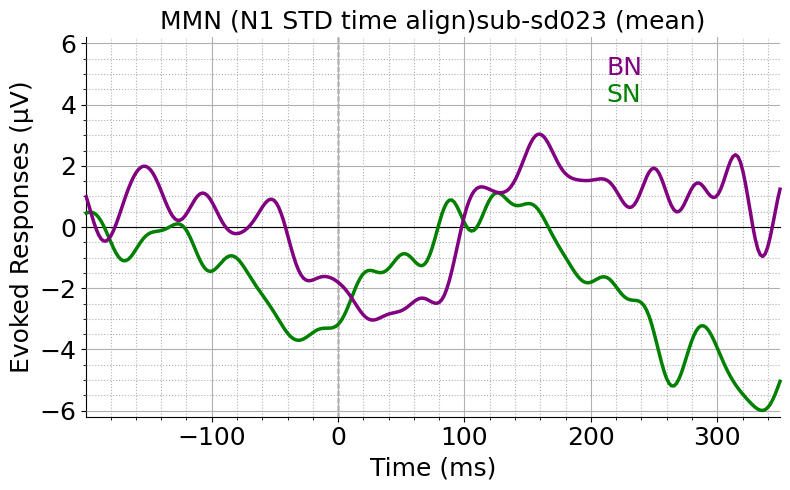

combining channels using "mean"
combining channels using "mean"


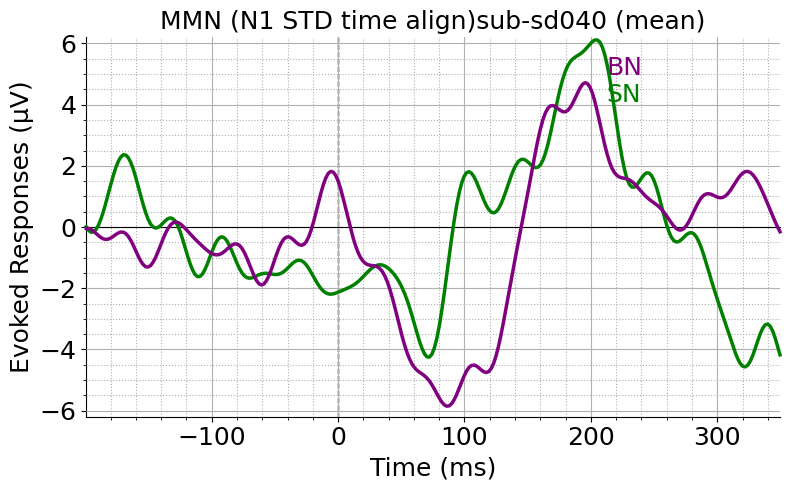

combining channels using "mean"
combining channels using "mean"


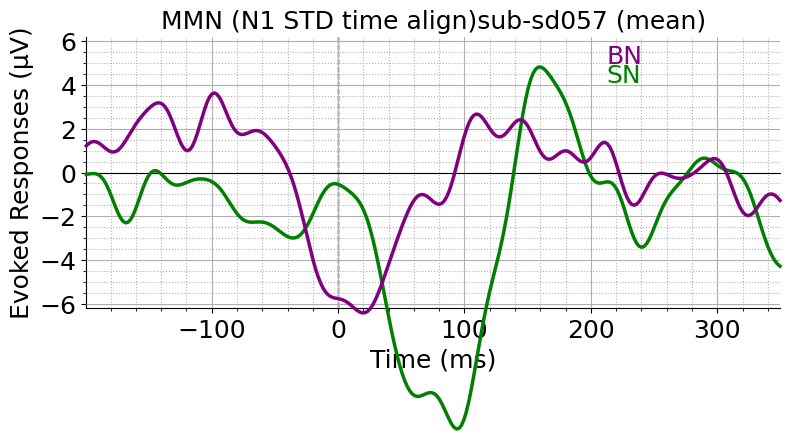

combining channels using "mean"
combining channels using "mean"


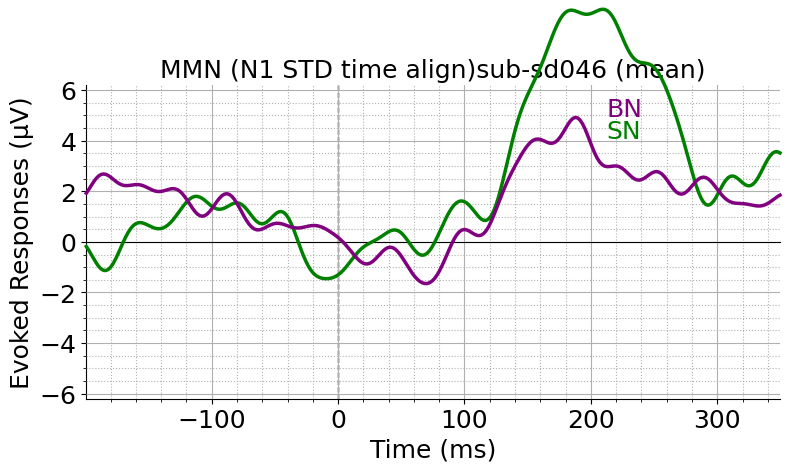

combining channels using "mean"
combining channels using "mean"


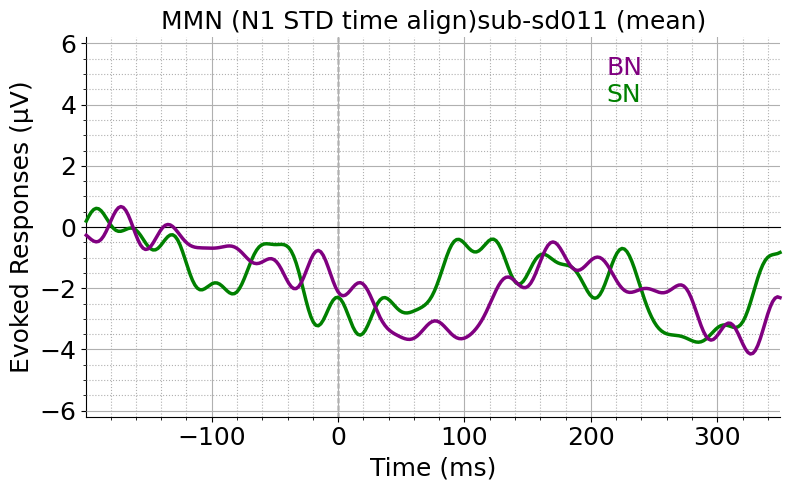

combining channels using "mean"
combining channels using "mean"


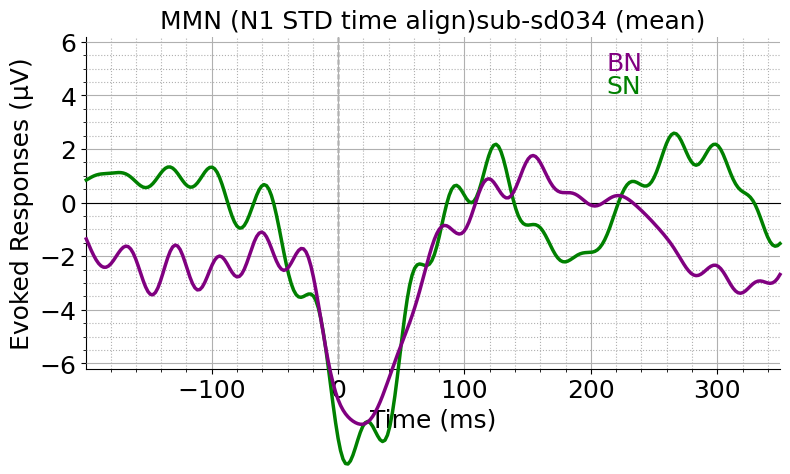

combining channels using "mean"
combining channels using "mean"


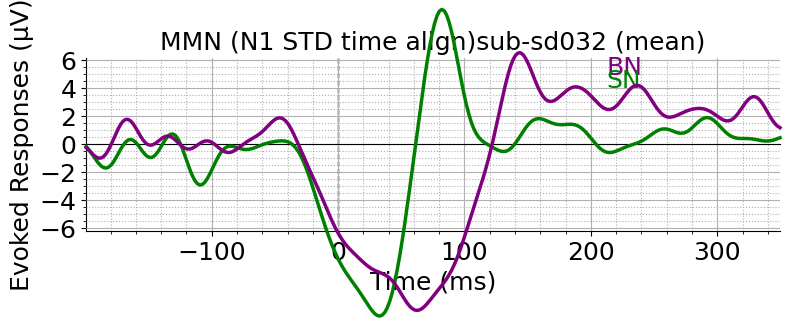

combining channels using "mean"
combining channels using "mean"


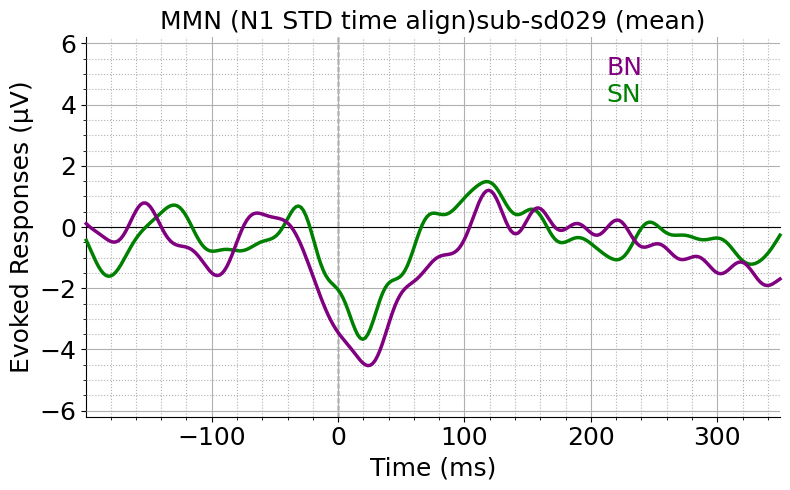

combining channels using "mean"
combining channels using "mean"


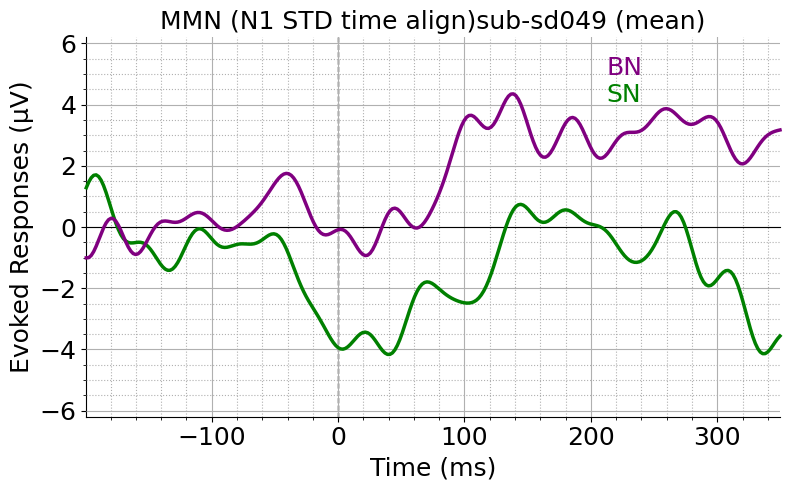

combining channels using "mean"
combining channels using "mean"


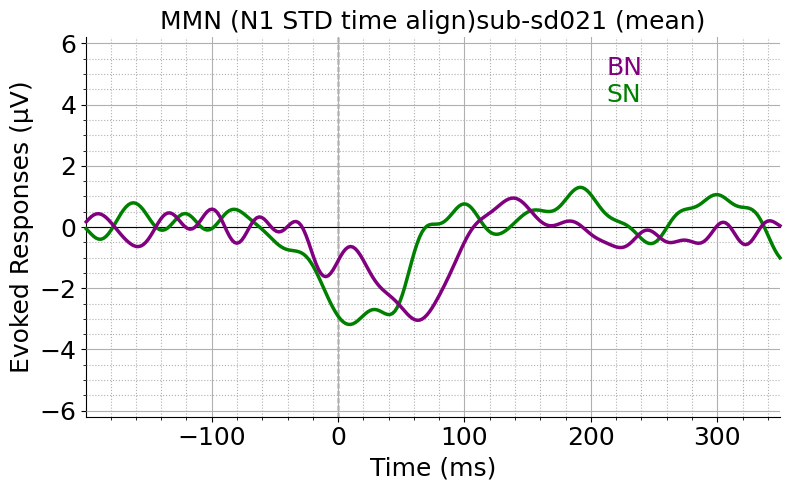

combining channels using "mean"
combining channels using "mean"


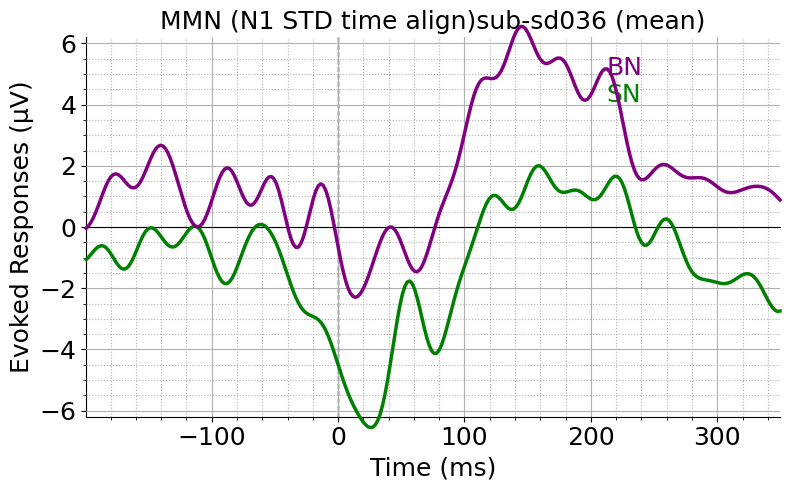

combining channels using "mean"
combining channels using "mean"


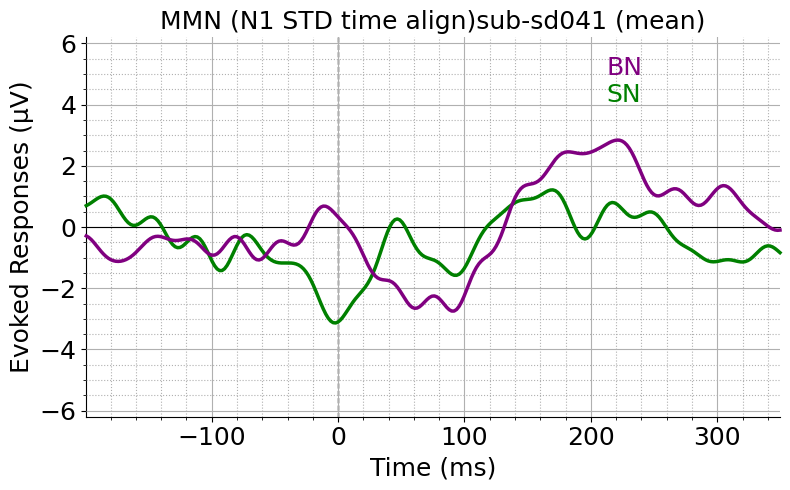

combining channels using "mean"
combining channels using "mean"


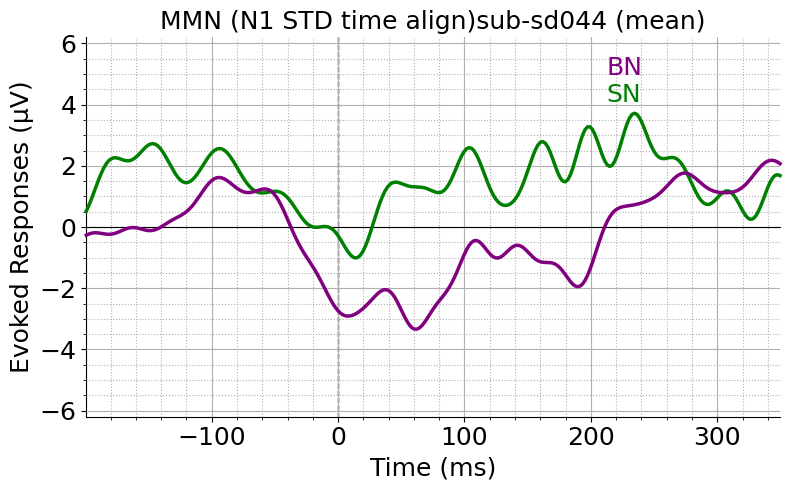

combining channels using "mean"
combining channels using "mean"


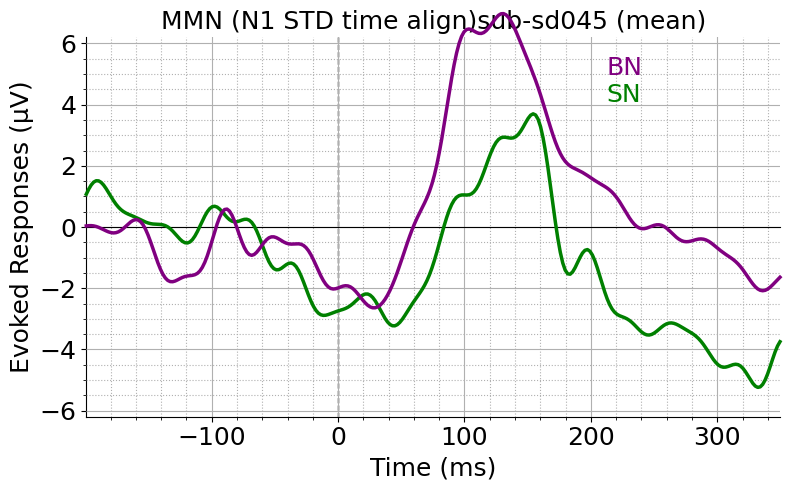

combining channels using "mean"
combining channels using "mean"


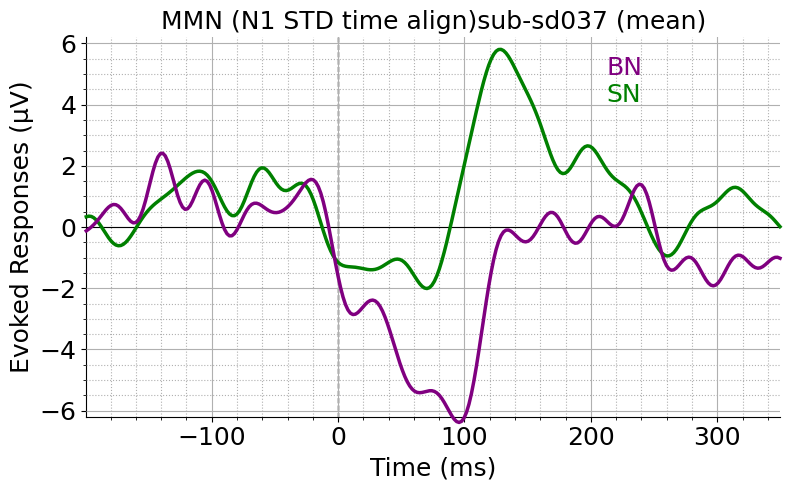

combining channels using "mean"
combining channels using "mean"


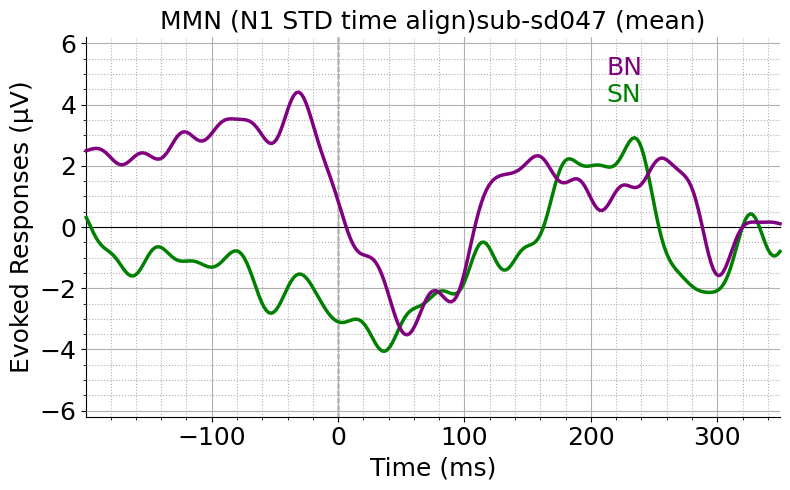

combining channels using "mean"
combining channels using "mean"


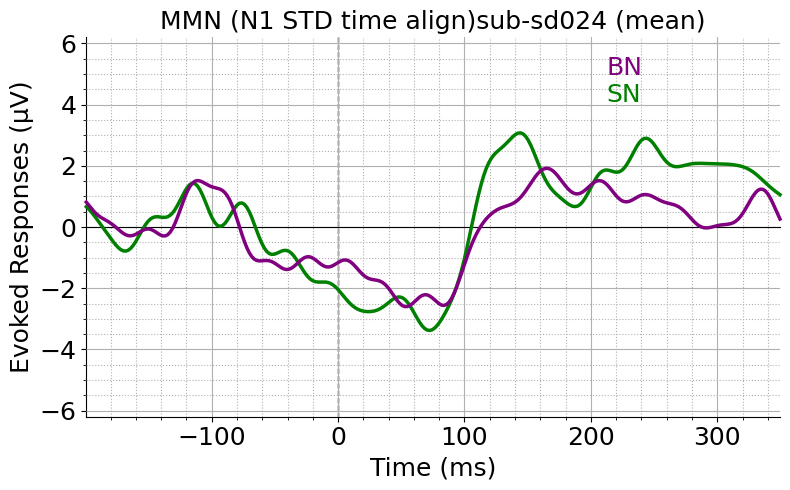

combining channels using "mean"
combining channels using "mean"


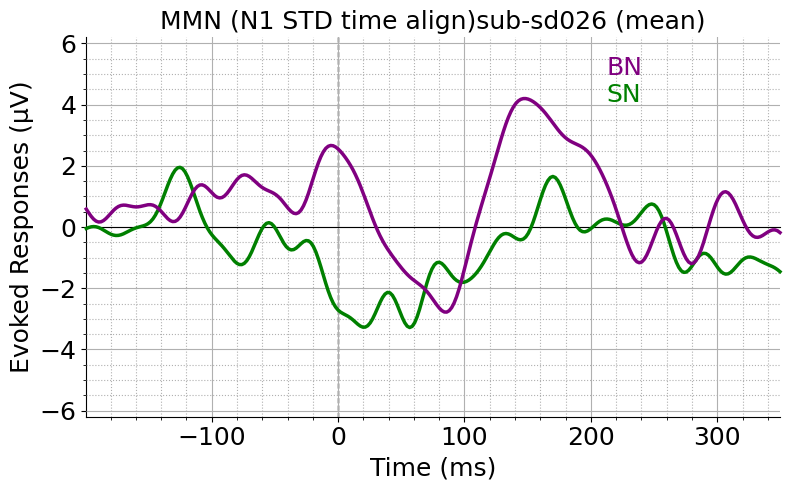

combining channels using "mean"
combining channels using "mean"


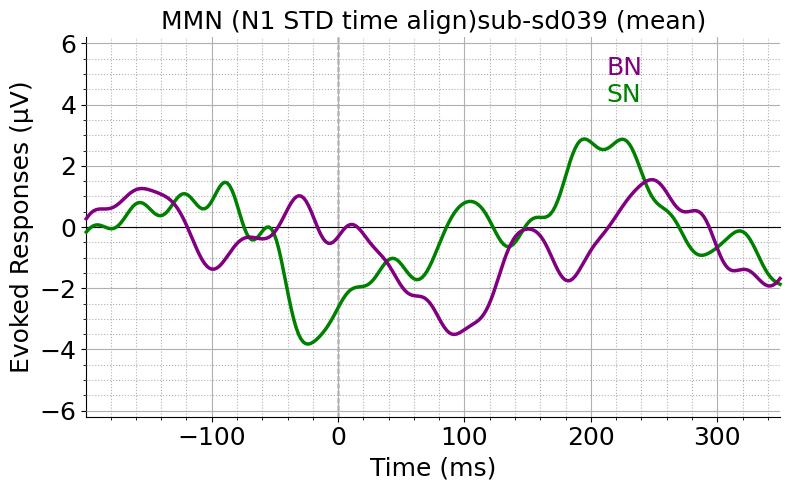

combining channels using "mean"
combining channels using "mean"


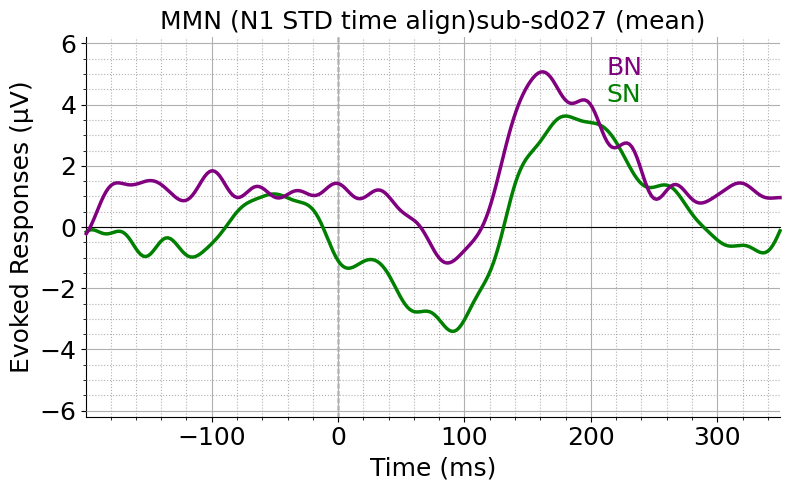

In [31]:
for sub in sn_STD_N1_aligned_SN_MMN_evokeds_dict_all:
    MMN_evokeds = {
           'SN': [sn_STD_N1_aligned_SN_MMN_evokeds_dict_all[sub] ],
           'BN':[beep_STD_N1_aligned_BN_MMN_evokeds_dict_all[sub]]  ,
                      }
    stylesdict ={
             'SN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
    text_labels = [
            (0.90, "BN",'purple'),
            (0.83, f"SN",'green'),
            ] 
    fig, axs = plt.subplots(figsize=(8, 5), dpi=100)
    try:
        plot_erps(MMN_evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"MMN (N1 STD time align){sub}",time_range=(-.200,.350))
        plt.show()
        
    except:
        print('Error', sub)

# Right_frontal MMN

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


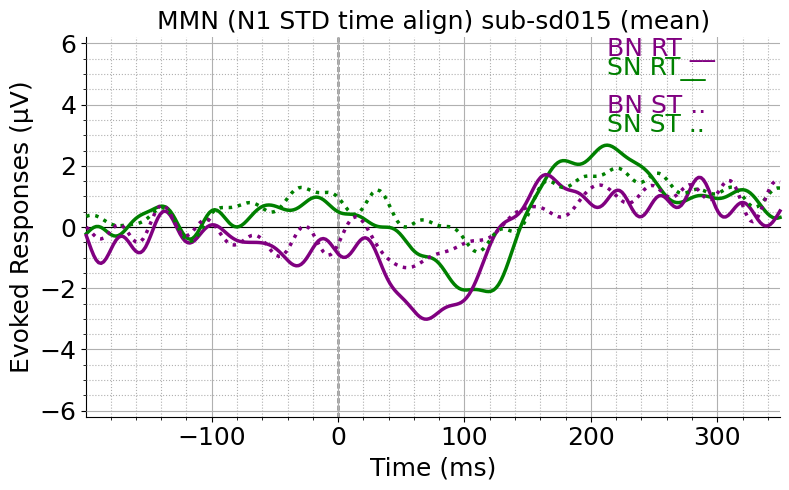

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


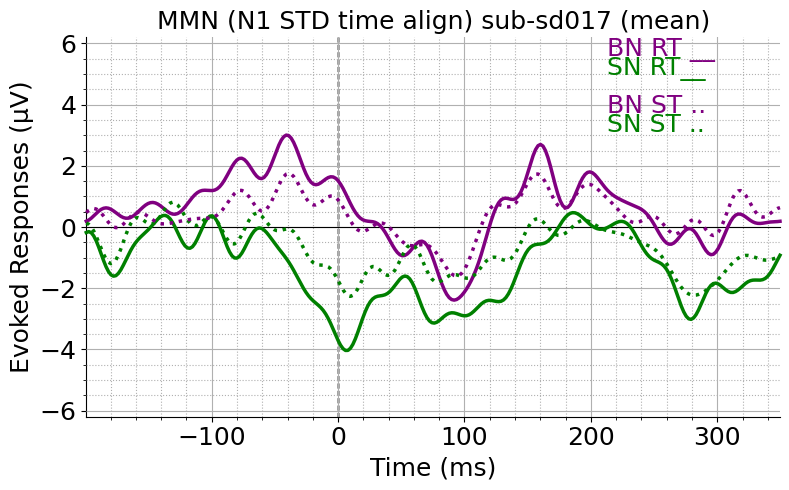

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


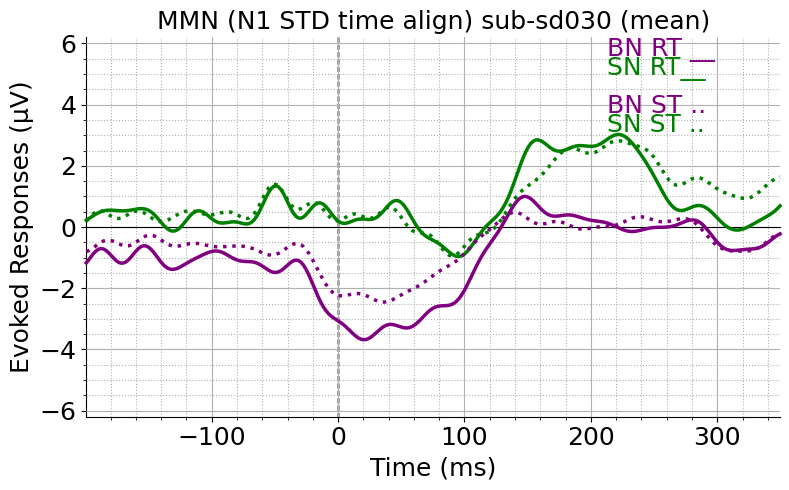

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


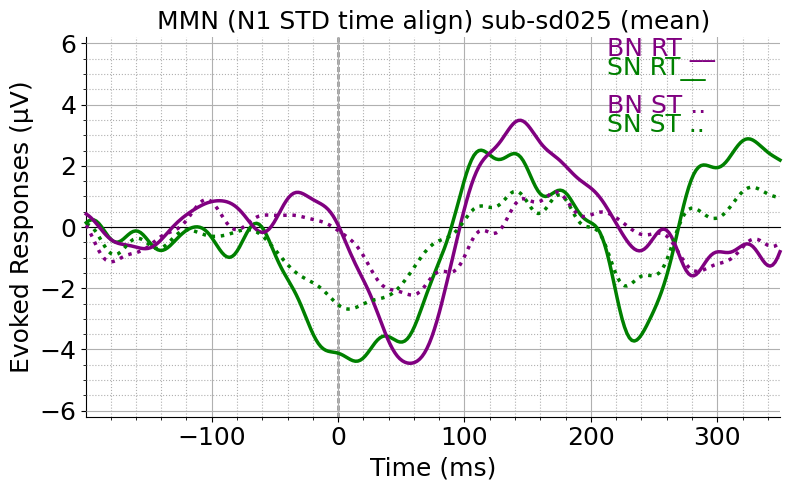

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


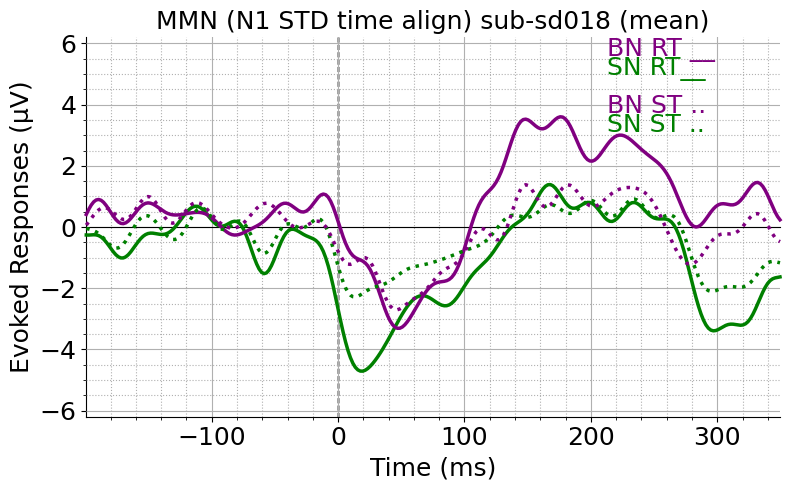

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


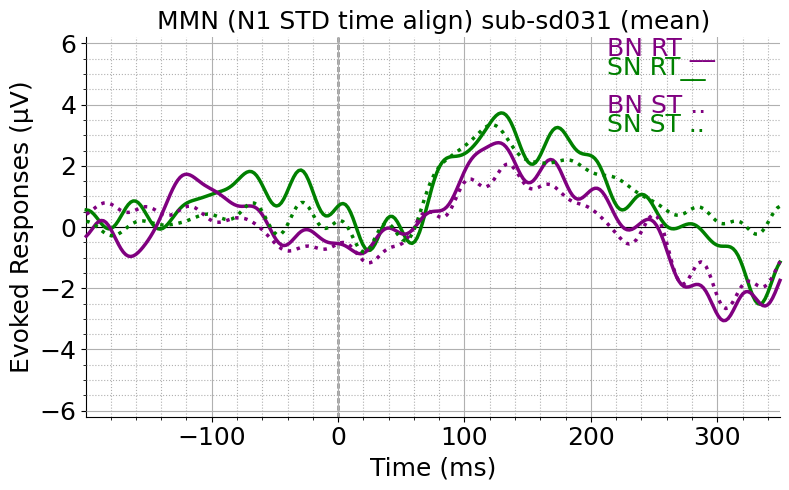

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


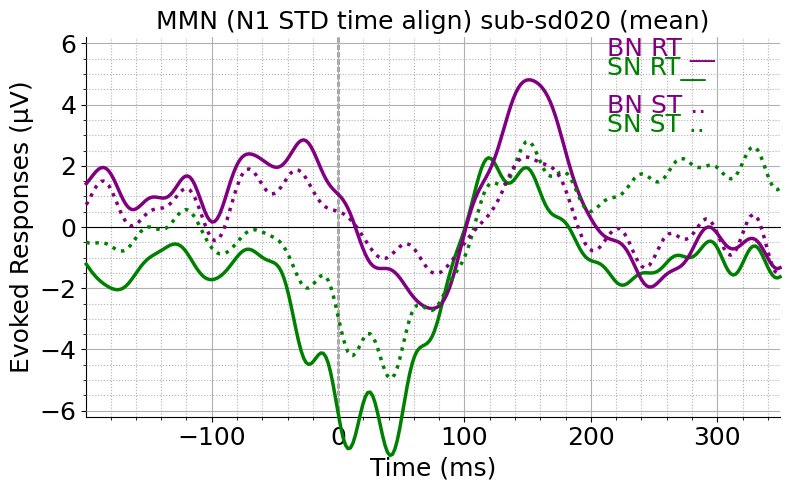

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


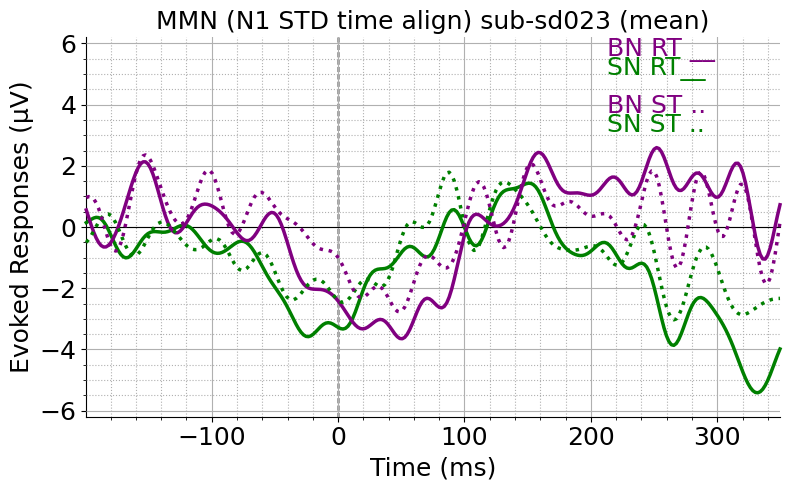

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


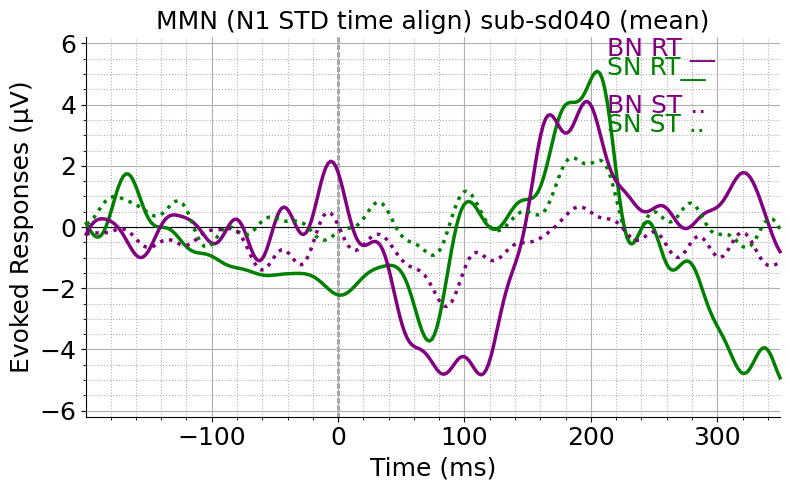

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


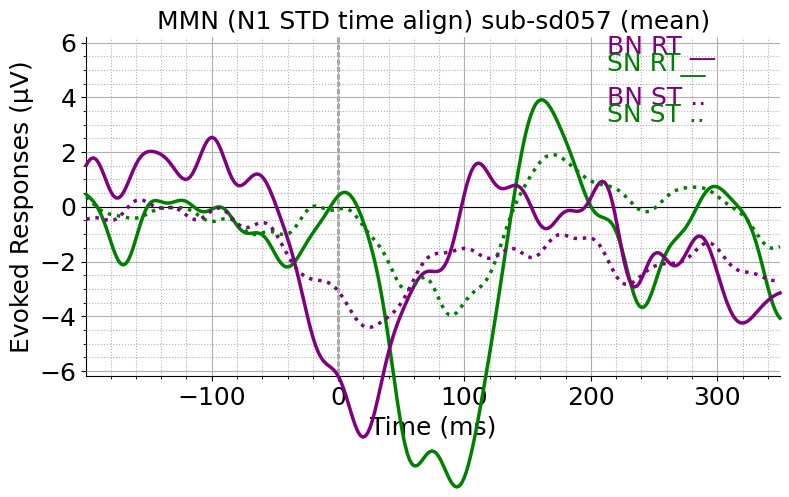

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


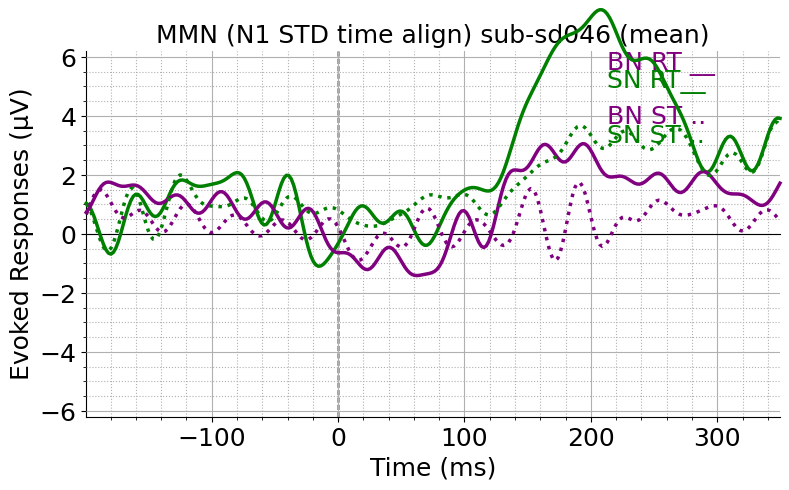

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


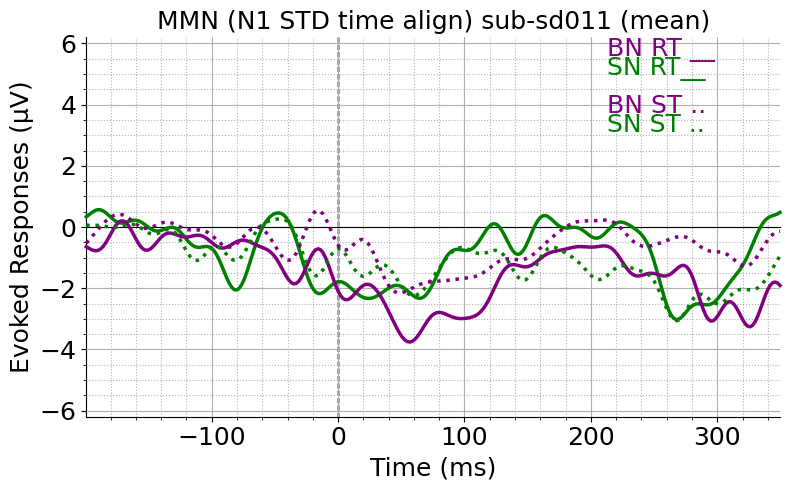

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


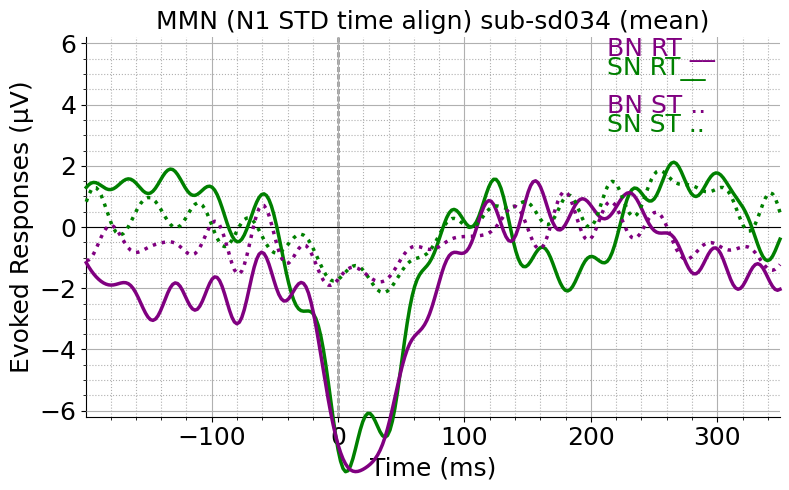

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


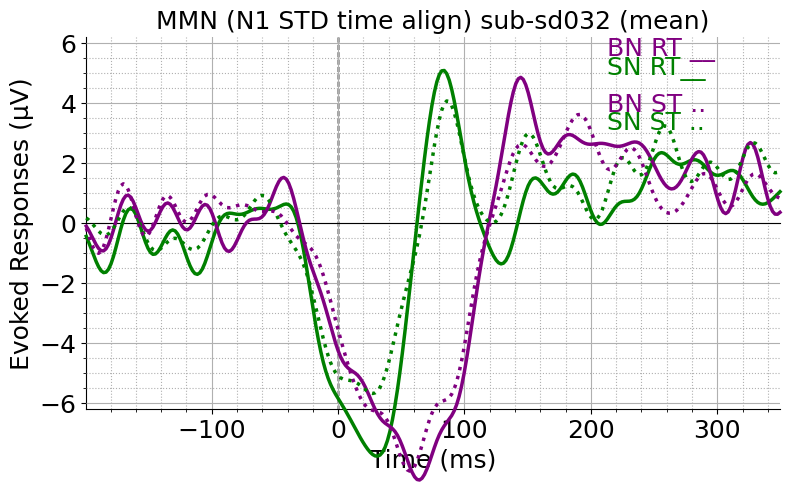

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


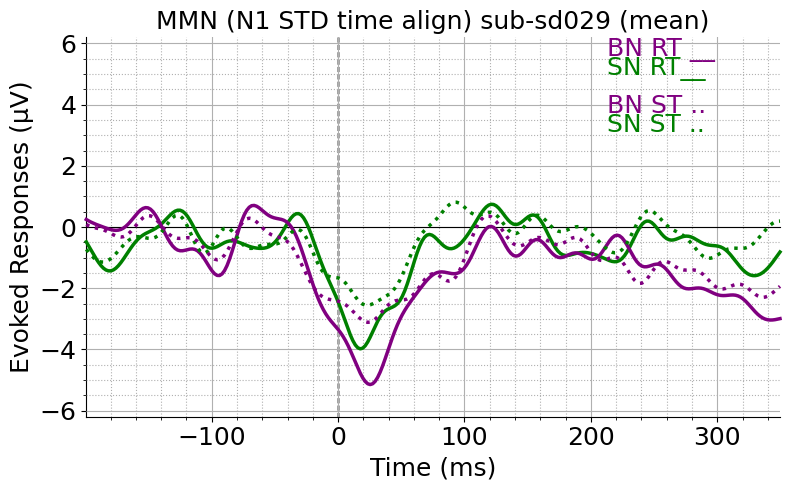

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


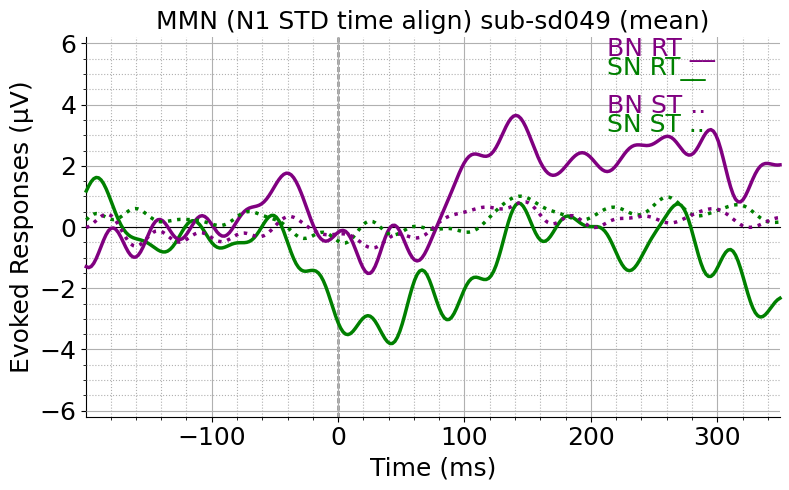

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


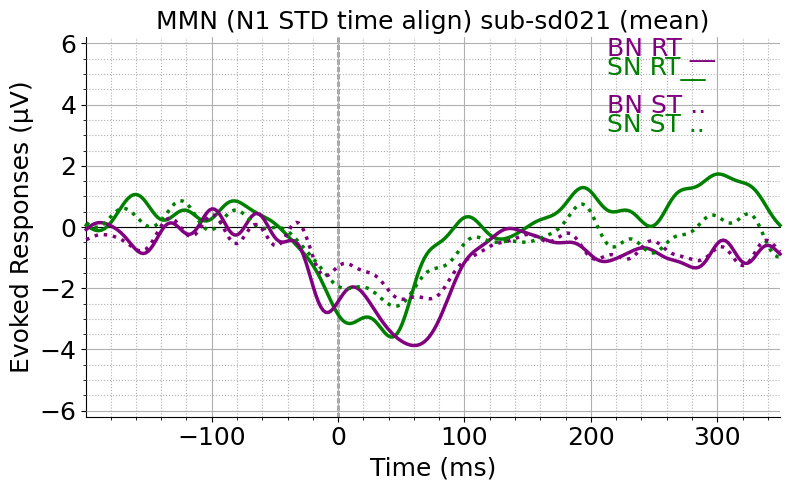

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


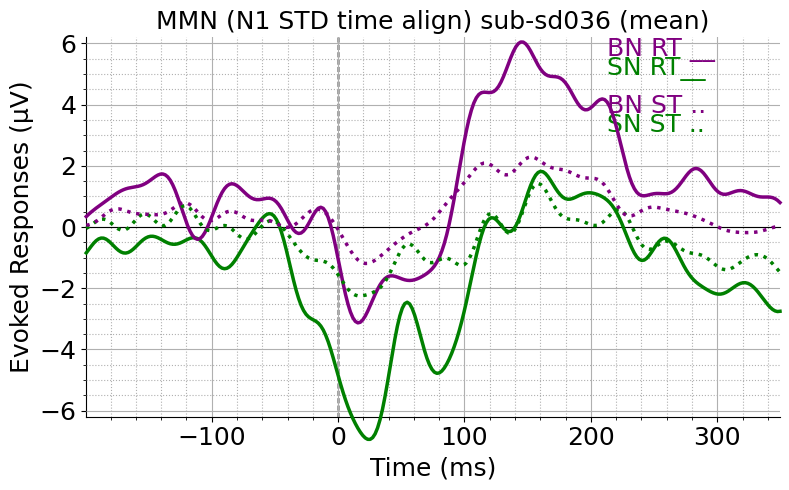

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


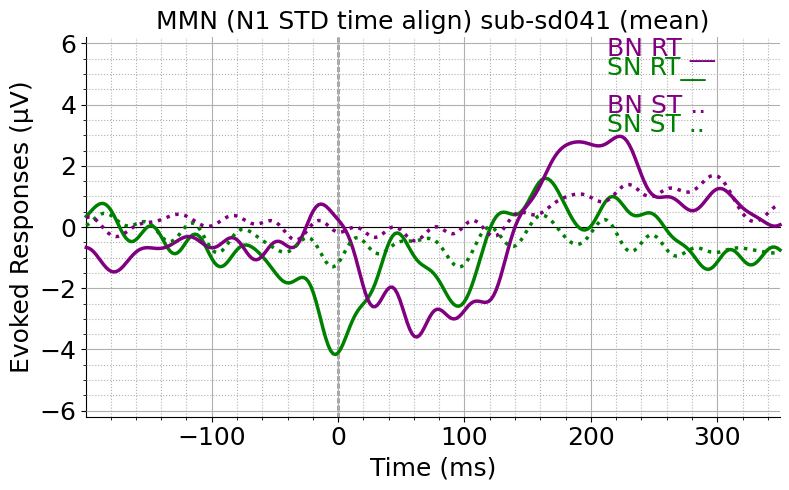

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


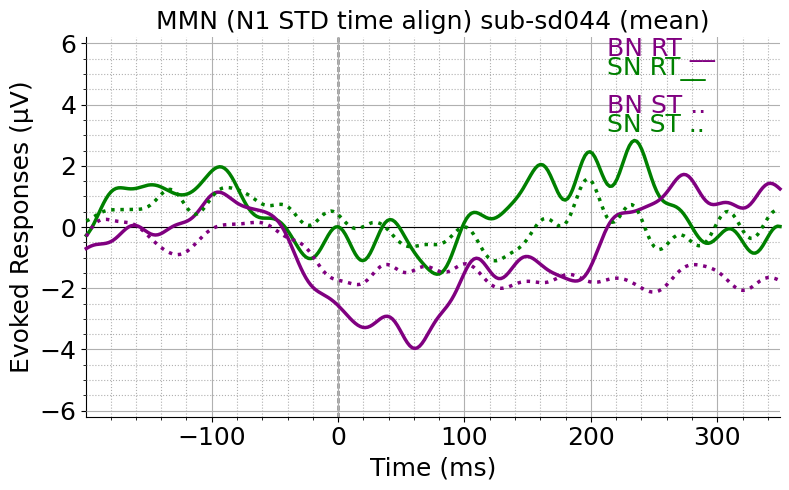

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


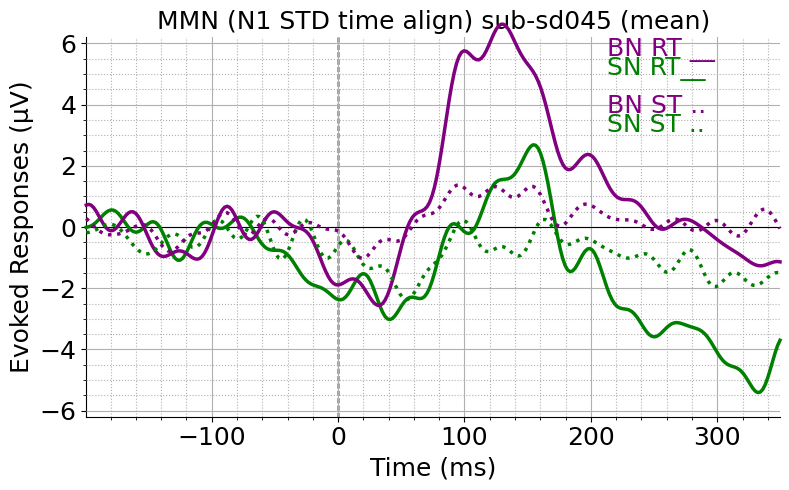

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


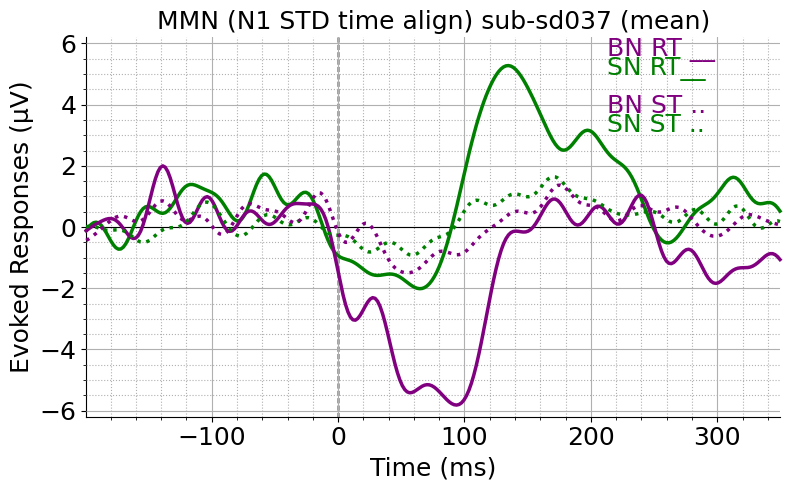

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


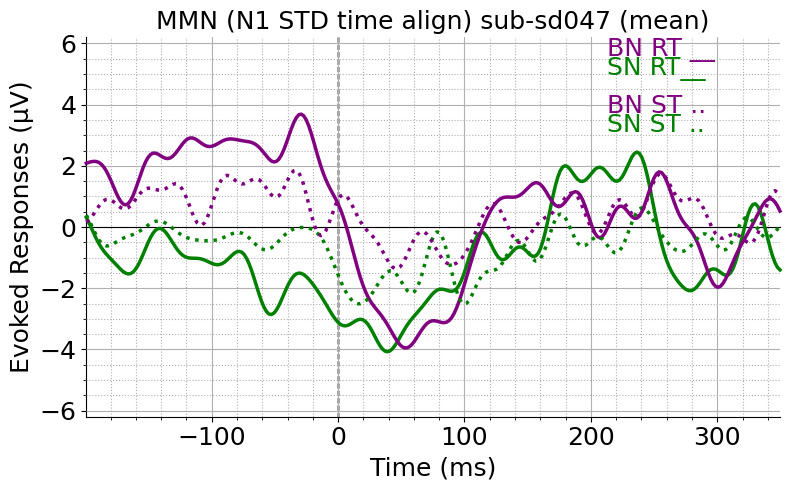

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


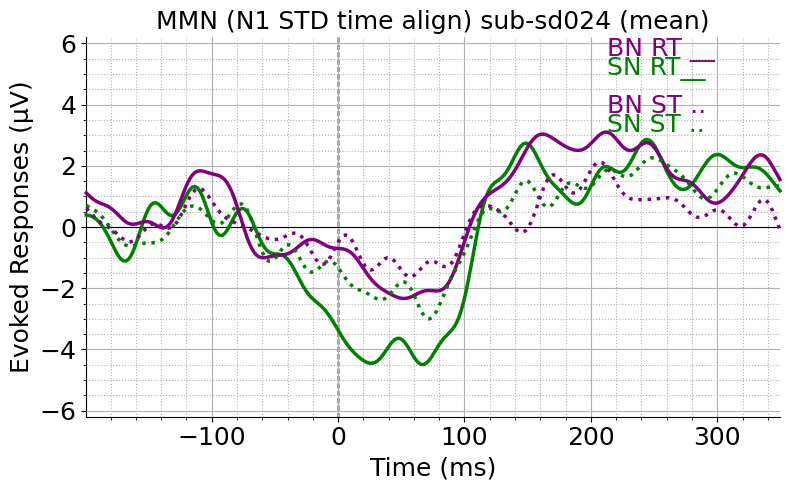

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


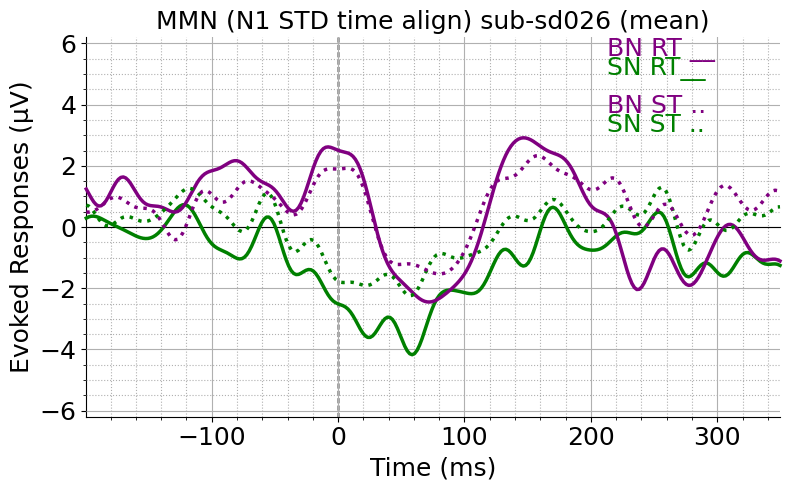

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


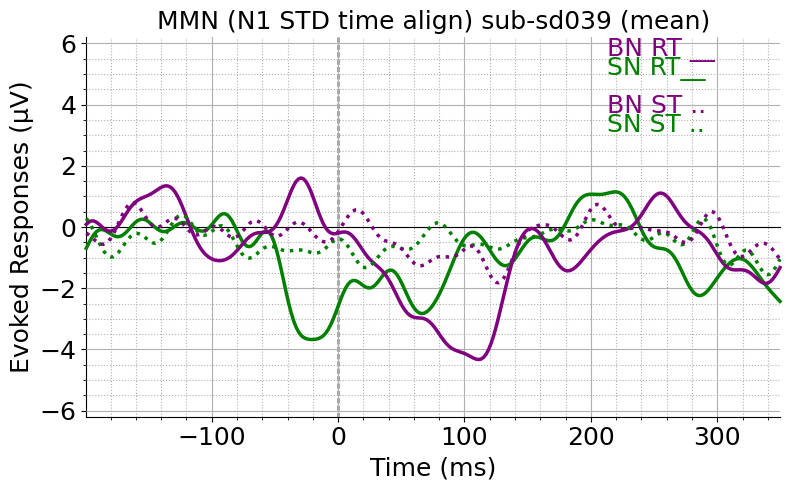

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


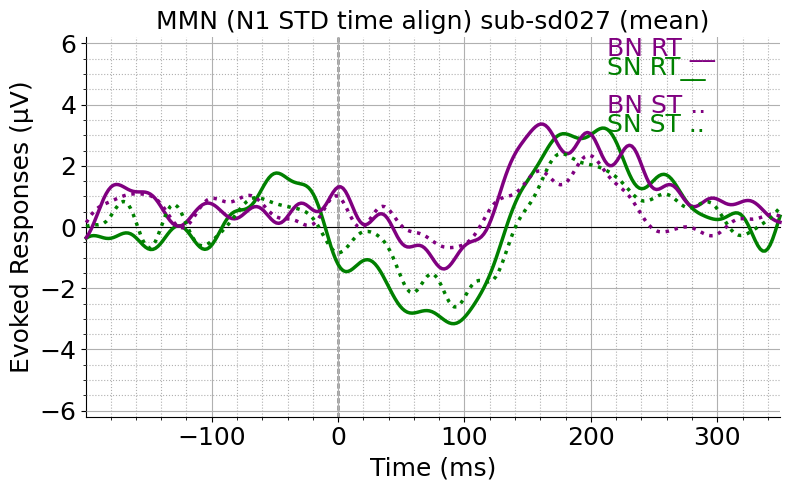

In [32]:
 
supratemporal = ['T7', 'T8', 'TP7', 'TP8']   
right_frontal = ['F4', 'F6', 'AF4','F2']
for sub in sn_STD_N1_aligned_SN_MMN_evokeds_dict_all:
    MMN_evokeds = {
           'SN RT': [sn_STD_N1_aligned_SN_MMN_evokeds_dict_all[sub] ],
           'BN RT':[beep_STD_N1_aligned_BN_MMN_evokeds_dict_all[sub]]  ,
                      }
    text_labels = [
            (0.90, "BN",'purple'),
            (0.83, f"SN",'green'),
            ]
    
    fig, axs = plt.subplots(figsize=(8, 5), dpi=100)
    stylesdict ={
             'SN RT': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},  
             "BN RT": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
    text_labels = [
            (0.95, "BN RT __",'purple'),
            (0.90, f"SN RT__",'green'),
            ]
    plot_erps(MMN_evokeds, picks=right_frontal,axs=axs,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"MMN (N1 STD time align) {sub}",time_range=(-.200,.350))
    MMN_evokeds = {
           'SN ST': [sn_STD_N1_aligned_SN_MMN_evokeds_dict_all[sub] ],
           'BN ST':[beep_STD_N1_aligned_BN_MMN_evokeds_dict_all[sub]]  ,
                      }
    stylesdict ={
             'SN ST': {"linewidth": 2.5,"linestyle":'dotted','color': 'green'},  
             "BN ST": {"linewidth": 2.5,"linestyle":'dotted','color': 'purple'},
             }
    text_labels = [
            (0.80, "BN ST ..",'purple'),
            (0.75, f"SN ST ..",'green'),
            ]
    plot_erps(MMN_evokeds, picks=supratemporal,axs=axs,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"MMN (N1 STD time align) {sub}",time_range=(-.200,.350))
    plt.show()
        

# Verification of N1